# Follow-Me Project
Congratulations on reaching the final project of the Robotics Nanodegree! 

Previously, you worked on the Semantic Segmentation lab where you built a deep learning network that locates a particular human target within an image. For this project, you will utilize what you implemented and learned from that lab and extend it to train a deep learning model that will allow a simulated quadcopter to follow around the person that it detects! 

Most of the code below is similar to the lab with some minor modifications. You can start with your existing solution, and modify and improve upon it to train the best possible model for this task.

You can click on any of the following to quickly jump to that part of this notebook:
1. [Data Collection](#data)
2. [FCN Layers](#fcn)
3. [Build the Model](#build)
4. [Training](#training)
5. [Prediction](#prediction)
6. [Evaluation](#evaluation)

## Data Collection<a id='data'></a>
We have provided you with a starting dataset for this project. Download instructions can be found in the README for this project's repo.
Alternatively, you can collect additional data of your own to improve your model. Check out the "Collecting Data" section in the Project Lesson in the Classroom for more details!

In [1]:
import os
import glob
import sys
import tensorflow as tf

from scipy import misc
import numpy as np

from tensorflow.contrib.keras.python import keras
from tensorflow.contrib.keras.python.keras import layers, models

from tensorflow import image

from utils import scoring_utils
from utils.separable_conv2d import SeparableConv2DKeras, BilinearUpSampling2D
from utils import data_iterator
from utils import plotting_tools 
from utils import model_tools

## FCN Layers <a id='fcn'></a>
In the Classroom, we discussed the different layers that constitute a fully convolutional network (FCN). The following code will introduce you to the functions that you need to build your semantic segmentation model.

### Separable Convolutions
The Encoder for your FCN will essentially require separable convolution layers, due to their advantages as explained in the classroom. The 1x1 convolution layer in the FCN, however, is a regular convolution. Implementations for both are provided below for your use. Each includes batch normalization with the ReLU activation function applied to the layers. 

In [2]:
def separable_conv2d_batchnorm(input_layer, filters, strides=1):
    output_layer = SeparableConv2DKeras(filters=filters,kernel_size=3, strides=strides,
                             padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

def conv2d_batchnorm(input_layer, filters, kernel_size=3, strides=1):
    output_layer = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, 
                      padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

### Bilinear Upsampling
The following helper function implements the bilinear upsampling layer. Upsampling by a factor of 2 is generally recommended, but you can try out different factors as well. Upsampling is used in the decoder block of the FCN.

In [3]:
def bilinear_upsample(input_layer):
    output_layer = BilinearUpSampling2D((2,2))(input_layer)
    return output_layer

## Build the Model <a id='build'></a>
In the following cells, you will build an FCN to train a model to detect and locate the hero target within an image. The steps are:
- Create an `encoder_block`
- Create a `decoder_block`
- Build the FCN consisting of encoder block(s), a 1x1 convolution, and decoder block(s).  This step requires experimentation with different numbers of layers and filter sizes to build your model.

### Encoder Block
Create an encoder block that includes a separable convolution layer using the `separable_conv2d_batchnorm()` function. The `filters` parameter defines the size or depth of the output layer. For example, 32 or 64. 

In [4]:
def encoder_block(input_layer, filters, strides):
    
    # Create a separable convolution layer using the separable_conv2d_batchnorm() function.
    output_layer = separable_conv2d_batchnorm(input_layer, filters, strides)
    
    return output_layer

### Decoder Block
The decoder block is comprised of three parts:
- A bilinear upsampling layer using the upsample_bilinear() function. The current recommended factor for upsampling is set to 2.
- A layer concatenation step. This step is similar to skip connections. You will concatenate the upsampled small_ip_layer and the large_ip_layer.
- Some (one or two) additional separable convolution layers to extract some more spatial information from prior layers.

In [5]:
def decoder_block(small_ip_layer, large_ip_layer, filters):
    
    # Upsample the small input layer using the bilinear_upsample() function.
    upsampled_small_ip_layer = bilinear_upsample(small_ip_layer)
    
    # Concatenate the upsampled and large input layers using layers.concatenate
    output_layer = layers.concatenate([upsampled_small_ip_layer, large_ip_layer])
    
    # Add some number of separable convolution layers
    output_layer = separable_conv2d_batchnorm( output_layer, filters, strides=1)
    output_layer = separable_conv2d_batchnorm( output_layer, filters, strides=1)
    
    return output_layer

### Model

Now that you have the encoder and decoder blocks ready, go ahead and build your FCN architecture! 

There are three steps:
- Add encoder blocks to build the encoder layers. This is similar to how you added regular convolutional layers in your CNN lab.
- Add a 1x1 Convolution layer using the conv2d_batchnorm() function. Remember that 1x1 Convolutions require a kernel and stride of 1.
- Add decoder blocks for the decoder layers.

In [6]:
def fcn_model(inputs, num_classes):
    
    # Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    layer01 = encoder_block(inputs , filters=32 , strides=2)
    layer02 = encoder_block(layer01, filters=64 , strides=2)
    layer03 = encoder_block(layer02, filters=128, strides=2)

    # Add 1x1 Convolution layer using conv2d_batchnorm().
    layer04 = conv2d_batchnorm(layer03, filters=256, kernel_size=1, strides=1)
    
    # Add the same number of Decoder Blocks as the number of Encoder Blocks
    layer05 = decoder_block(layer04, layer02, filters=128 )
    layer06 = decoder_block(layer05, layer01, filters=64  )
    x       = decoder_block(layer06, inputs , filters=32  )
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 1, activation='softmax', padding='same')(x)

## Training <a id='training'></a>
The following cells will use the FCN you created and define an ouput layer based on the size of the processed image and the number of classes recognized. You will define the hyperparameters to compile and train your model.

Please Note: For this project, the helper code in `data_iterator.py` will resize the copter images to 160x160x3 to speed up training.

In [7]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

image_hw = 160
image_shape = (image_hw, image_hw, 3)
inputs = layers.Input(image_shape)
num_classes = 3

# Call fcn_model()
output_layer = fcn_model(inputs, num_classes)

### Hyperparameters
Define and tune your hyperparameters.
- **batch_size**: number of training samples/images that get propagated through the network in a single pass.
- **num_epochs**: number of times the entire training dataset gets propagated through the network.
- **steps_per_epoch**: number of batches of training images that go through the network in 1 epoch. We have provided you with a default value. One recommended value to try would be based on the total number of images in training dataset divided by the batch_size.
- **validation_steps**: number of batches of validation images that go through the network in 1 epoch. This is similar to steps_per_epoch, except validation_steps is for the validation dataset. We have provided you with a default value for this as well.
- **workers**: maximum number of processes to spin up. This can affect your training speed and is dependent on your hardware. We have provided a recommended value to work with. 

In [29]:
learning_rate = 0.003
batch_size = 20
num_epochs = 400
steps_per_epoch = 50
validation_steps = 50
workers = 8

Epoch 1/400
49/50 [============================>.] - ETA: 1s - loss: 0.0105

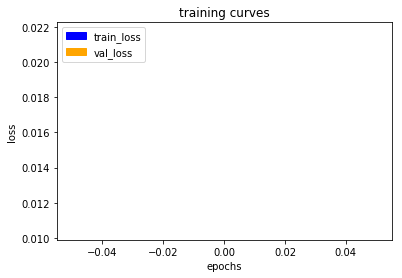

50/50 [==============================] - 79s - loss: 0.0105 - val_loss: 0.0217
Epoch 2/400
49/50 [============================>.] - ETA: 1s - loss: 0.0112

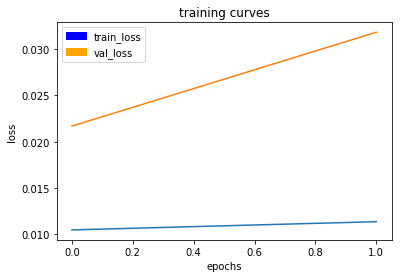

50/50 [==============================] - 77s - loss: 0.0113 - val_loss: 0.0318
Epoch 3/400
49/50 [============================>.] - ETA: 1s - loss: 0.0103

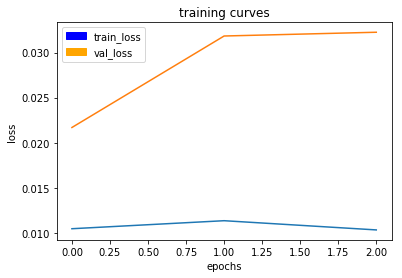

50/50 [==============================] - 77s - loss: 0.0103 - val_loss: 0.0323
Epoch 4/400
49/50 [============================>.] - ETA: 1s - loss: 0.0112

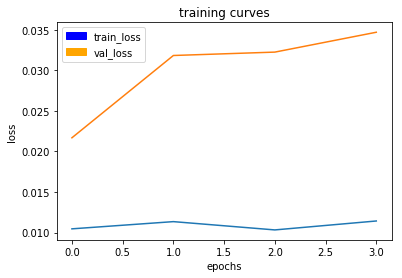

50/50 [==============================] - 78s - loss: 0.0114 - val_loss: 0.0347
Epoch 5/400
49/50 [============================>.] - ETA: 1s - loss: 0.0116

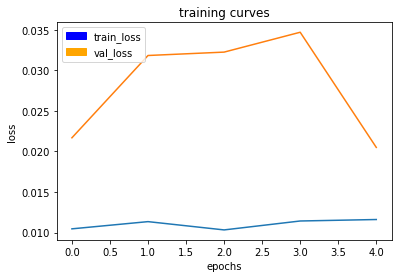

50/50 [==============================] - 77s - loss: 0.0116 - val_loss: 0.0205
Epoch 6/400
49/50 [============================>.] - ETA: 1s - loss: 0.0103

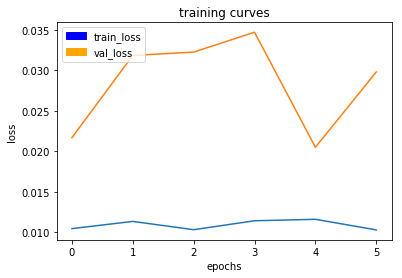

50/50 [==============================] - 77s - loss: 0.0103 - val_loss: 0.0298
Epoch 7/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

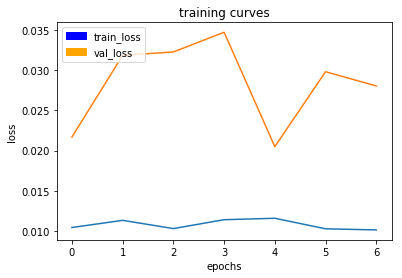

50/50 [==============================] - 77s - loss: 0.0102 - val_loss: 0.0280
Epoch 8/400
49/50 [============================>.] - ETA: 1s - loss: 0.0116

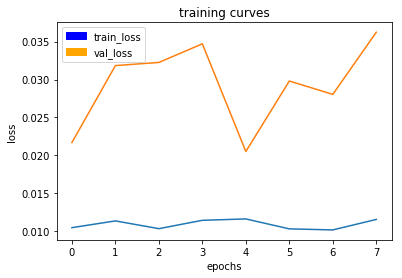

50/50 [==============================] - 77s - loss: 0.0115 - val_loss: 0.0362
Epoch 9/400
49/50 [============================>.] - ETA: 1s - loss: 0.0114

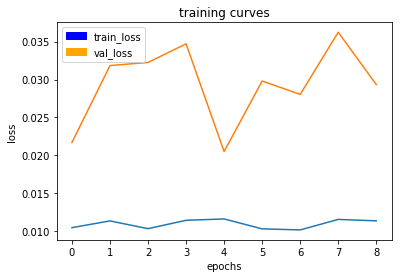

50/50 [==============================] - 77s - loss: 0.0114 - val_loss: 0.0293
Epoch 10/400
49/50 [============================>.] - ETA: 1s - loss: 0.0116

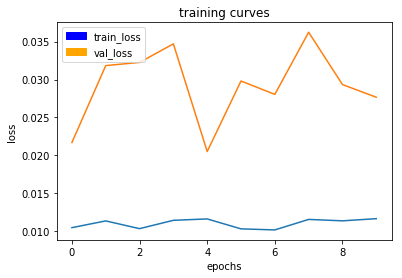

50/50 [==============================] - 77s - loss: 0.0116 - val_loss: 0.0277
Epoch 11/400
49/50 [============================>.] - ETA: 1s - loss: 0.0110

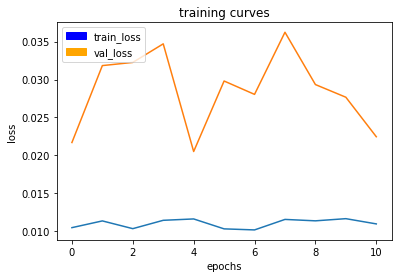

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0225
Epoch 12/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

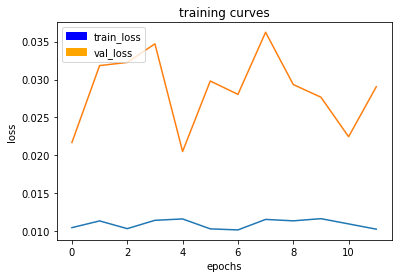

50/50 [==============================] - 77s - loss: 0.0103 - val_loss: 0.0290
Epoch 13/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

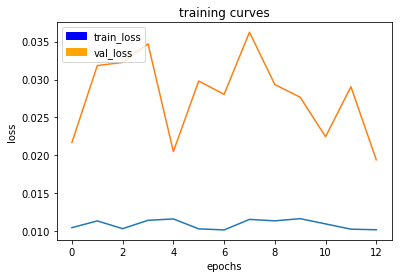

50/50 [==============================] - 76s - loss: 0.0102 - val_loss: 0.0194
Epoch 14/400
49/50 [============================>.] - ETA: 1s - loss: 0.0099

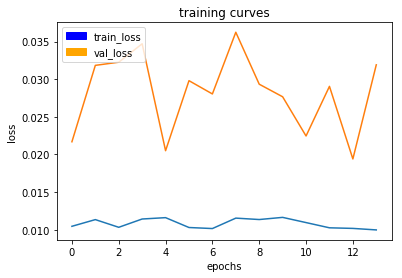

50/50 [==============================] - 77s - loss: 0.0100 - val_loss: 0.0319
Epoch 15/400
49/50 [============================>.] - ETA: 1s - loss: 0.0100

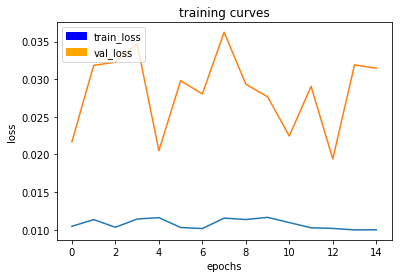

50/50 [==============================] - 78s - loss: 0.0100 - val_loss: 0.0315
Epoch 16/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

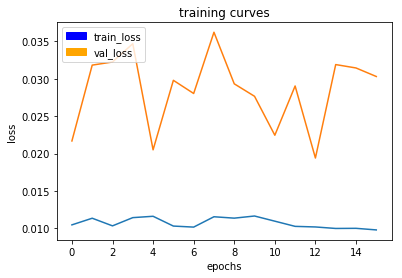

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0303
Epoch 17/400
49/50 [============================>.] - ETA: 1s - loss: 0.0109

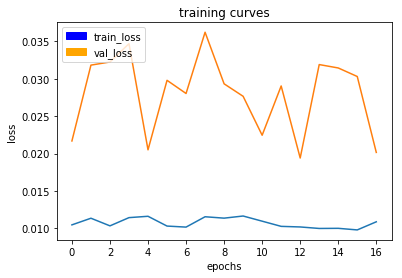

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0202
Epoch 18/400
49/50 [============================>.] - ETA: 1s - loss: 0.0107

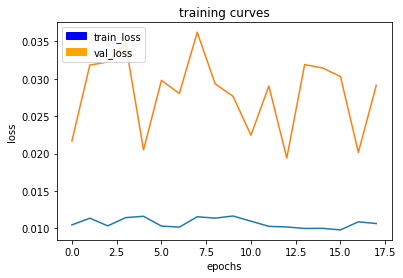

50/50 [==============================] - 77s - loss: 0.0106 - val_loss: 0.0291
Epoch 19/400
49/50 [============================>.] - ETA: 1s - loss: 0.0114

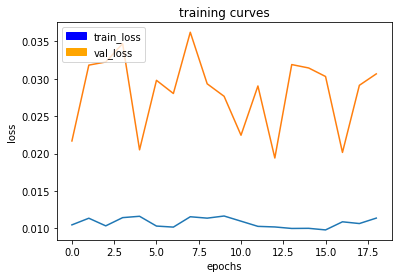

50/50 [==============================] - 77s - loss: 0.0114 - val_loss: 0.0307
Epoch 20/400
49/50 [============================>.] - ETA: 1s - loss: 0.0106

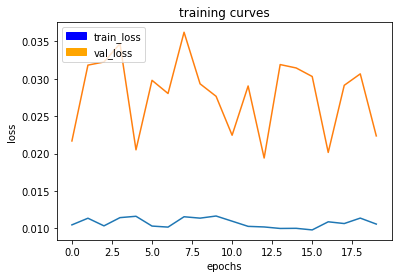

50/50 [==============================] - 77s - loss: 0.0106 - val_loss: 0.0224
Epoch 21/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

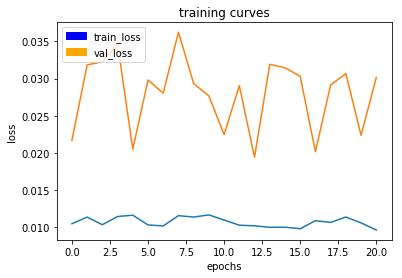

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0301
Epoch 22/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

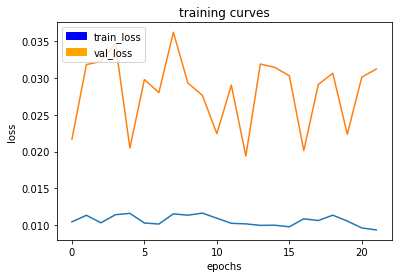

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0312
Epoch 23/400
49/50 [============================>.] - ETA: 1s - loss: 0.0109

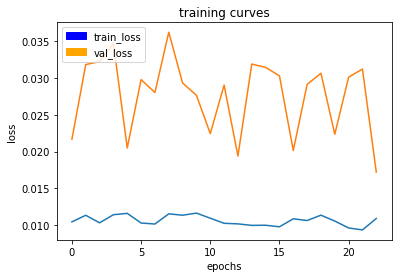

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0172
Epoch 24/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

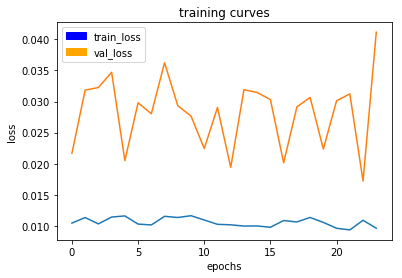

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0411
Epoch 25/400
49/50 [============================>.] - ETA: 1s - loss: 0.0100

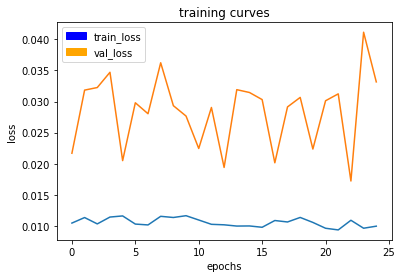

50/50 [==============================] - 77s - loss: 0.0100 - val_loss: 0.0332
Epoch 26/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

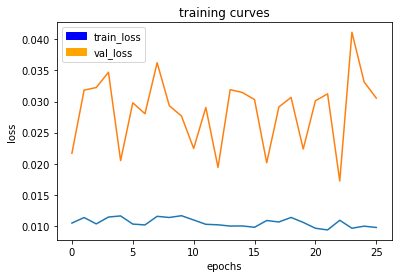

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0306
Epoch 27/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

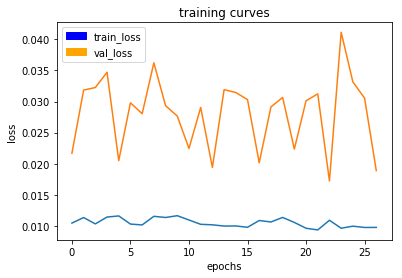

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0189
Epoch 28/400
49/50 [============================>.] - ETA: 1s - loss: 0.0113

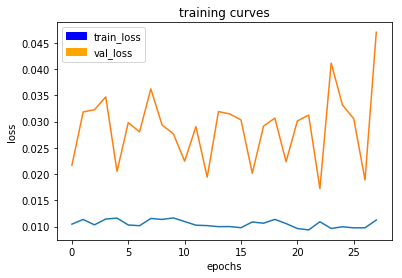

50/50 [==============================] - 77s - loss: 0.0112 - val_loss: 0.0470
Epoch 29/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

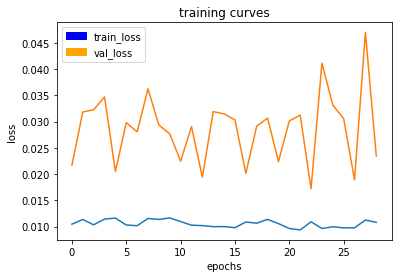

50/50 [==============================] - 76s - loss: 0.0108 - val_loss: 0.0234
Epoch 30/400
49/50 [============================>.] - ETA: 1s - loss: 0.0112

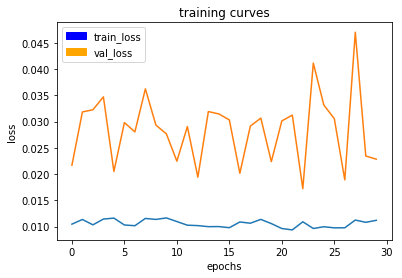

50/50 [==============================] - 77s - loss: 0.0112 - val_loss: 0.0228
Epoch 31/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

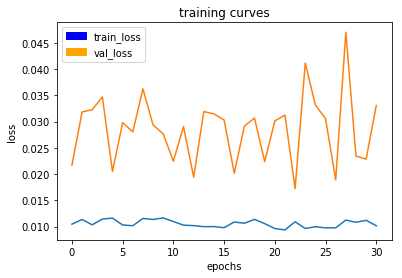

50/50 [==============================] - 77s - loss: 0.0101 - val_loss: 0.0331
Epoch 32/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

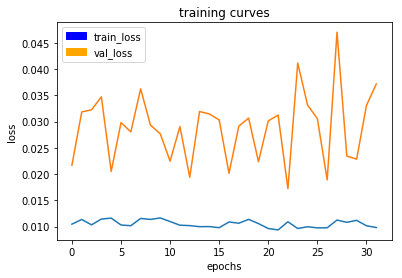

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0372
Epoch 33/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

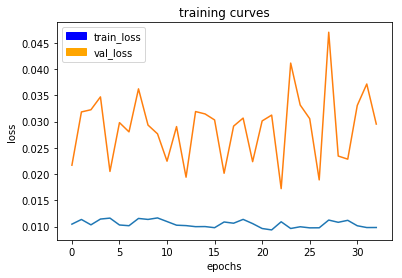

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0295
Epoch 34/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

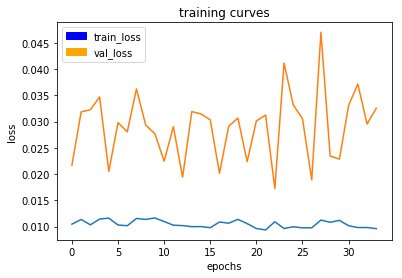

50/50 [==============================] - 76s - loss: 0.0096 - val_loss: 0.0325
Epoch 35/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

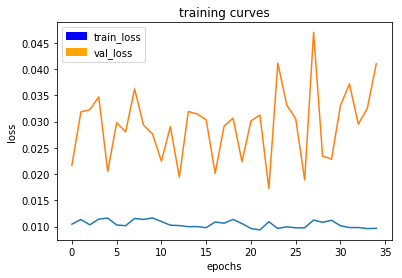

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0410
Epoch 36/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

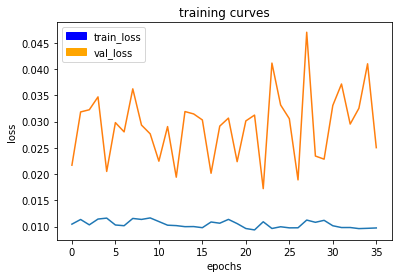

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0250
Epoch 37/400
49/50 [============================>.] - ETA: 1s - loss: 0.0099

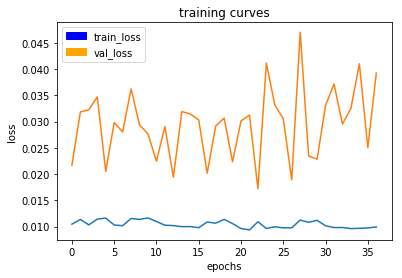

50/50 [==============================] - 77s - loss: 0.0099 - val_loss: 0.0392
Epoch 38/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

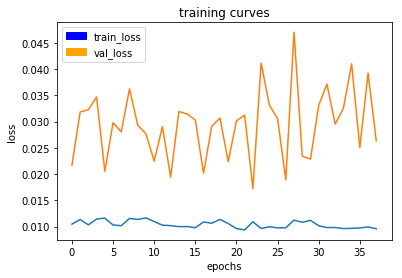

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0263
Epoch 39/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

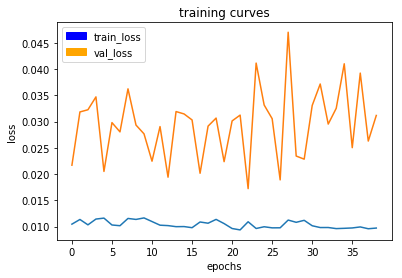

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0312
Epoch 40/400
49/50 [============================>.] - ETA: 1s - loss: 0.0100

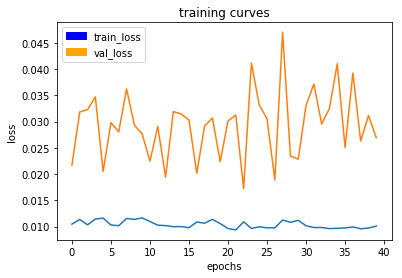

50/50 [==============================] - 77s - loss: 0.0101 - val_loss: 0.0269
Epoch 41/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

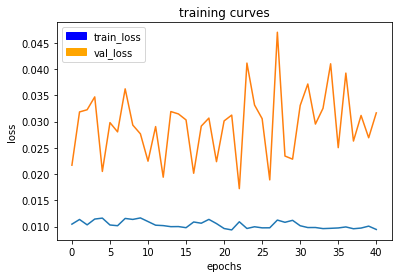

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0317
Epoch 42/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

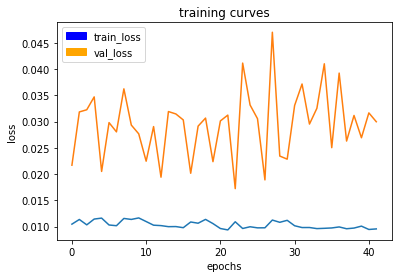

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0300
Epoch 43/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

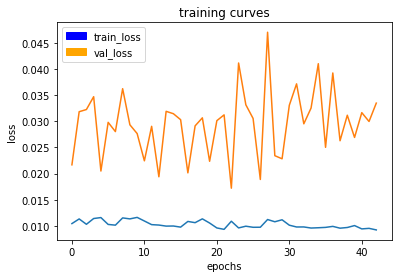

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0335
Epoch 44/400
49/50 [============================>.] - ETA: 1s - loss: 0.0110

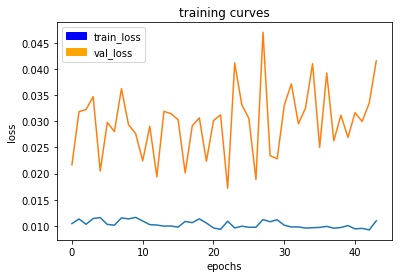

50/50 [==============================] - 77s - loss: 0.0110 - val_loss: 0.0415
Epoch 45/400
49/50 [============================>.] - ETA: 1s - loss: 0.0107

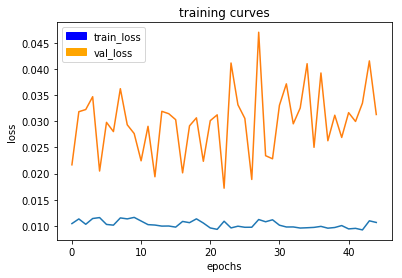

50/50 [==============================] - 77s - loss: 0.0107 - val_loss: 0.0313
Epoch 46/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

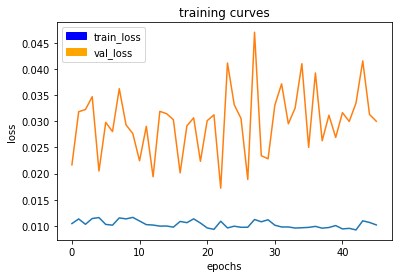

50/50 [==============================] - 76s - loss: 0.0102 - val_loss: 0.0300
Epoch 47/400
49/50 [============================>.] - ETA: 1s - loss: 0.0099

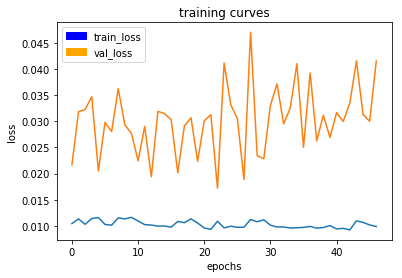

50/50 [==============================] - 77s - loss: 0.0099 - val_loss: 0.0415
Epoch 48/400
49/50 [============================>.] - ETA: 1s - loss: 0.0160

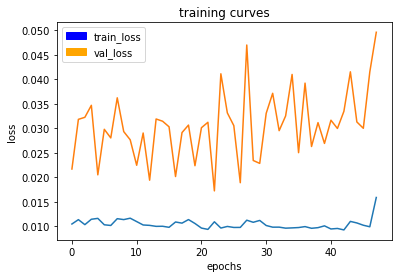

50/50 [==============================] - 77s - loss: 0.0159 - val_loss: 0.0496
Epoch 49/400
49/50 [============================>.] - ETA: 1s - loss: 0.0113

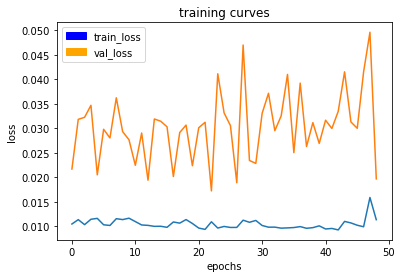

50/50 [==============================] - 77s - loss: 0.0113 - val_loss: 0.0197
Epoch 50/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

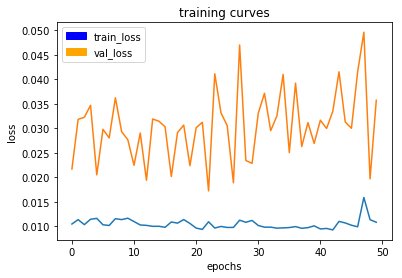

50/50 [==============================] - 77s - loss: 0.0108 - val_loss: 0.0357
Epoch 51/400
49/50 [============================>.] - ETA: 1s - loss: 0.0099

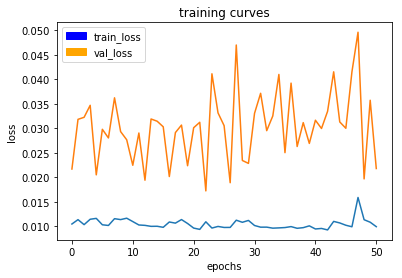

50/50 [==============================] - 77s - loss: 0.0099 - val_loss: 0.0218
Epoch 52/400
49/50 [============================>.] - ETA: 1s - loss: 0.0101

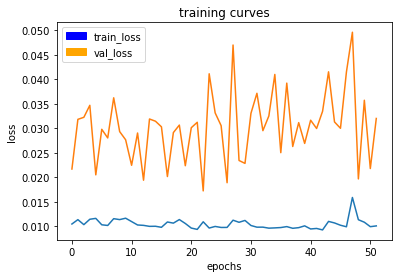

50/50 [==============================] - 77s - loss: 0.0101 - val_loss: 0.0320
Epoch 53/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

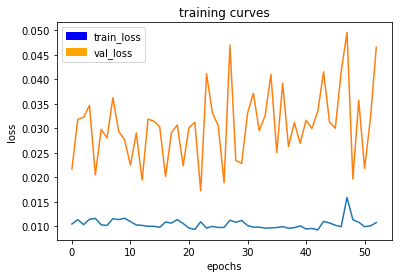

50/50 [==============================] - 77s - loss: 0.0108 - val_loss: 0.0466
Epoch 54/400
49/50 [============================>.] - ETA: 1s - loss: 0.0106

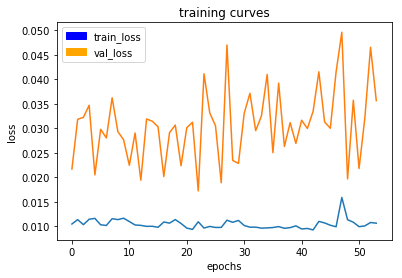

50/50 [==============================] - 77s - loss: 0.0106 - val_loss: 0.0357
Epoch 55/400
49/50 [============================>.] - ETA: 1s - loss: 0.0117

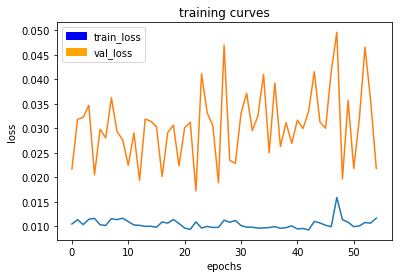

50/50 [==============================] - 77s - loss: 0.0117 - val_loss: 0.0218
Epoch 56/400
49/50 [============================>.] - ETA: 1s - loss: 0.0100

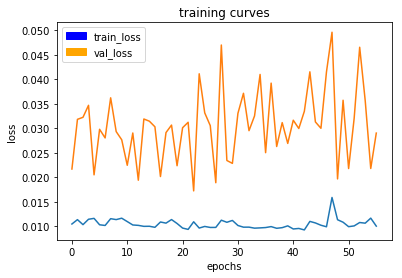

50/50 [==============================] - 77s - loss: 0.0100 - val_loss: 0.0290
Epoch 57/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

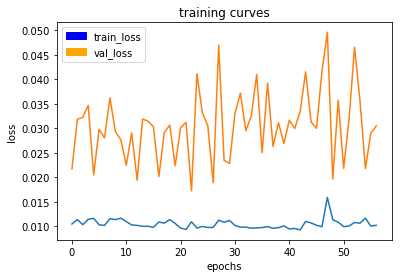

50/50 [==============================] - 77s - loss: 0.0102 - val_loss: 0.0305
Epoch 58/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

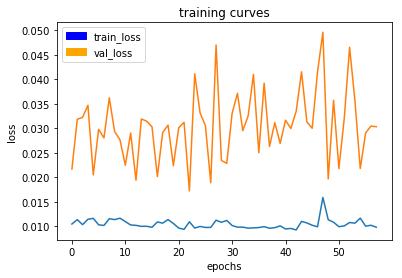

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0303
Epoch 59/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

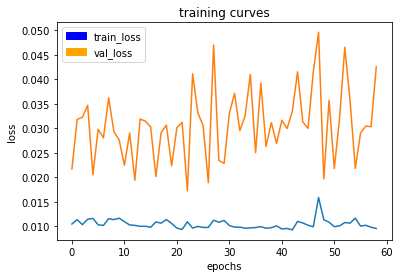

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0426
Epoch 60/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

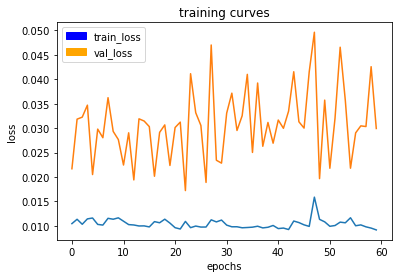

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0299
Epoch 61/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

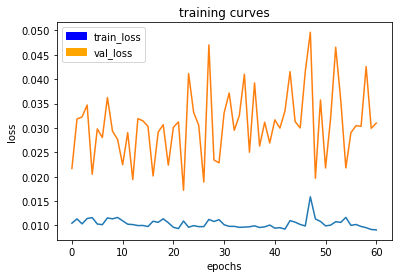

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0310
Epoch 62/400
49/50 [============================>.] - ETA: 1s - loss: 0.0109

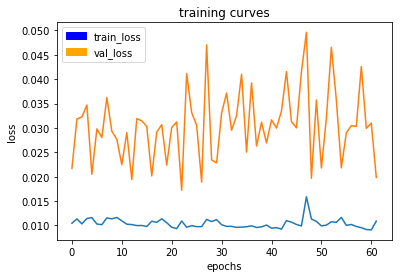

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0199
Epoch 63/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

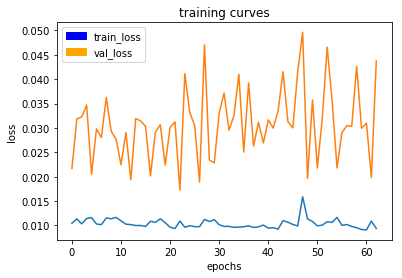

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0437
Epoch 64/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

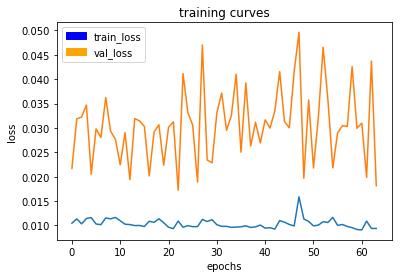

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0182
Epoch 65/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

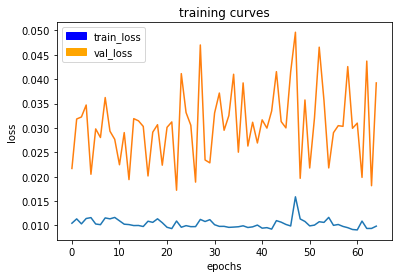

50/50 [==============================] - 77s - loss: 0.0099 - val_loss: 0.0392
Epoch 66/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

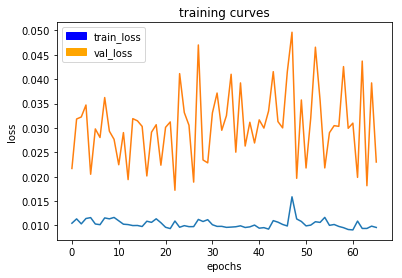

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0230
Epoch 67/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

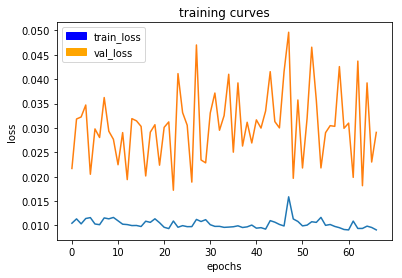

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0291
Epoch 68/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

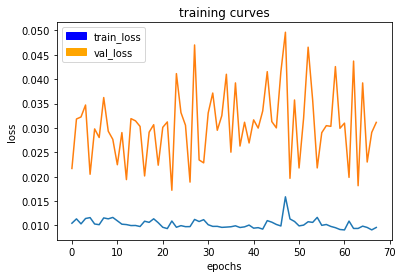

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0311
Epoch 69/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

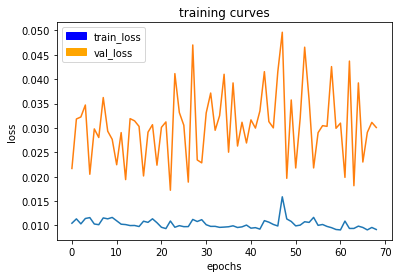

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0301
Epoch 70/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

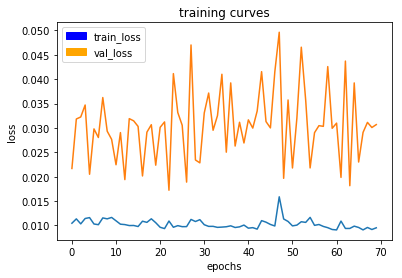

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0307
Epoch 71/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

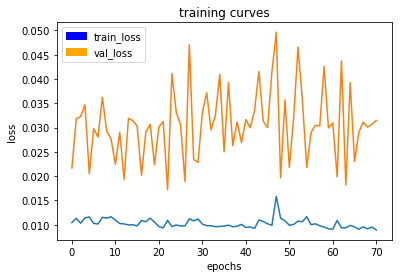

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0315
Epoch 72/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

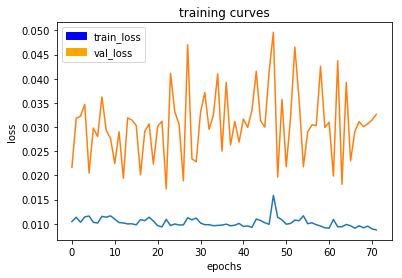

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0326
Epoch 73/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

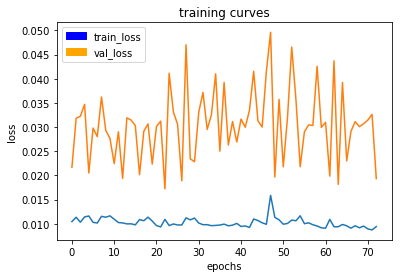

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0193
Epoch 74/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

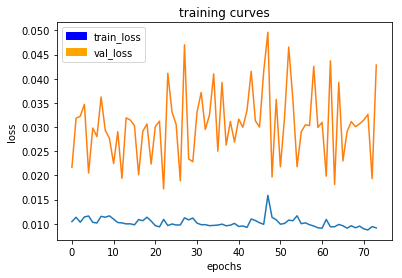

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0428
Epoch 75/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

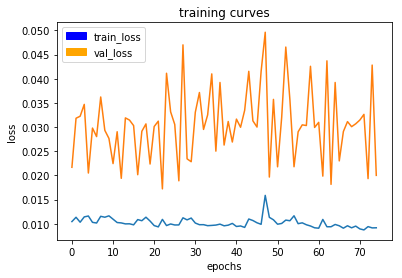

50/50 [==============================] - 76s - loss: 0.0092 - val_loss: 0.0200
Epoch 76/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

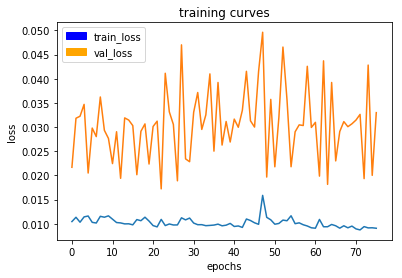

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0330
Epoch 77/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

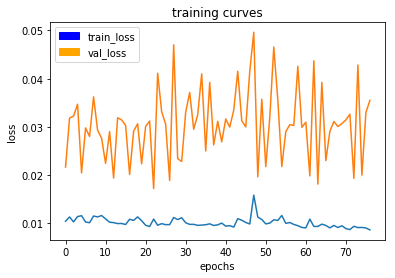

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0355
Epoch 78/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

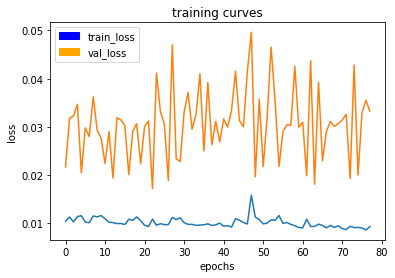

50/50 [==============================] - 77s - loss: 0.0093 - val_loss: 0.0333
Epoch 79/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

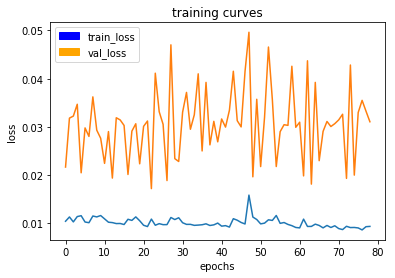

50/50 [==============================] - 76s - loss: 0.0094 - val_loss: 0.0311
Epoch 80/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

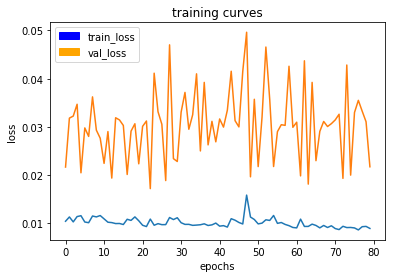

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0217
Epoch 81/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

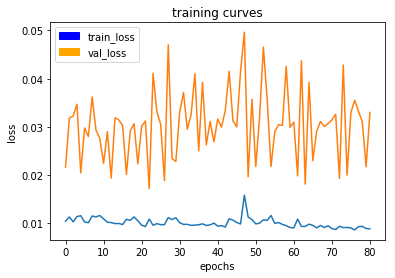

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0330
Epoch 82/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

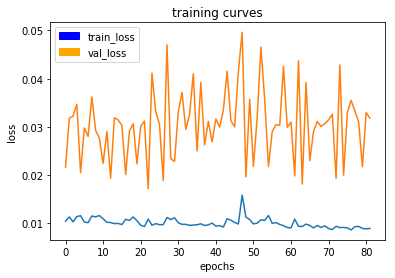

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0318
Epoch 83/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

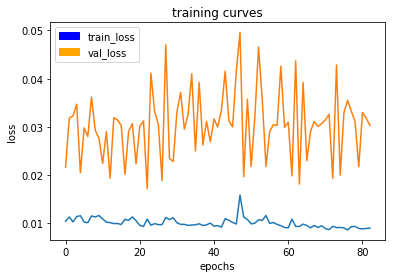

50/50 [==============================] - 76s - loss: 0.0090 - val_loss: 0.0303
Epoch 84/400
49/50 [============================>.] - ETA: 1s - loss: 0.0113

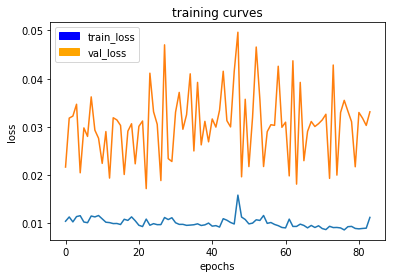

50/50 [==============================] - 77s - loss: 0.0113 - val_loss: 0.0331
Epoch 85/400
49/50 [============================>.] - ETA: 1s - loss: 0.0101

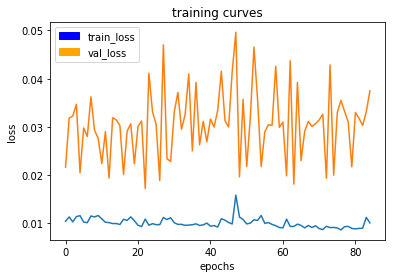

50/50 [==============================] - 77s - loss: 0.0101 - val_loss: 0.0375
Epoch 86/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

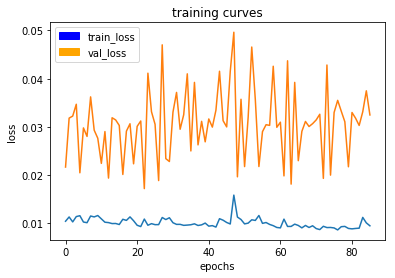

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0325
Epoch 87/400
49/50 [============================>.] - ETA: 1s - loss: 0.0113

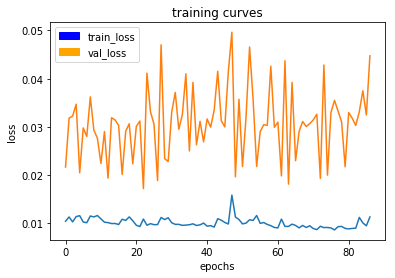

50/50 [==============================] - 76s - loss: 0.0114 - val_loss: 0.0447
Epoch 88/400
49/50 [============================>.] - ETA: 1s - loss: 0.0161

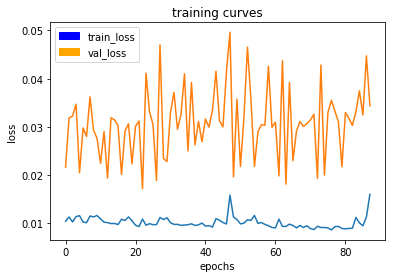

50/50 [==============================] - 77s - loss: 0.0160 - val_loss: 0.0344
Epoch 89/400
49/50 [============================>.] - ETA: 1s - loss: 0.0107

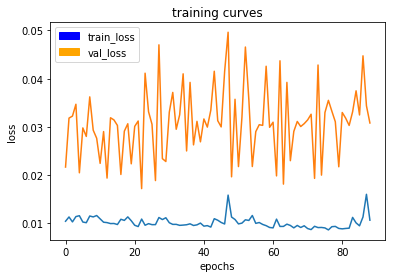

50/50 [==============================] - 77s - loss: 0.0107 - val_loss: 0.0308
Epoch 90/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

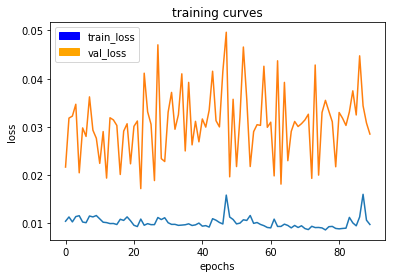

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0285
Epoch 91/400
49/50 [============================>.] - ETA: 1s - loss: 0.0102

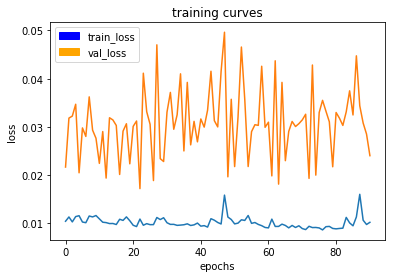

50/50 [==============================] - 77s - loss: 0.0102 - val_loss: 0.0240
Epoch 92/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

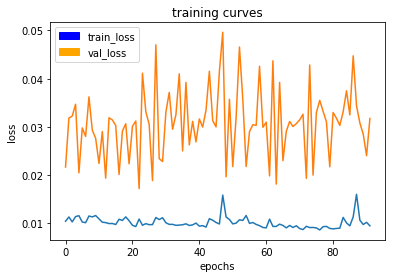

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0318
Epoch 93/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

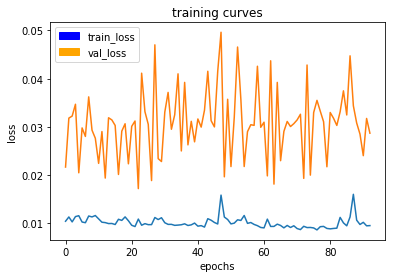

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0287
Epoch 94/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

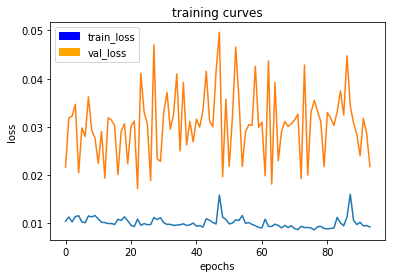

50/50 [==============================] - 77s - loss: 0.0093 - val_loss: 0.0218
Epoch 95/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

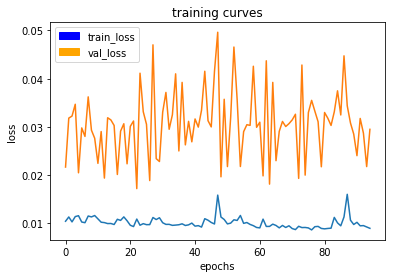

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0295
Epoch 96/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

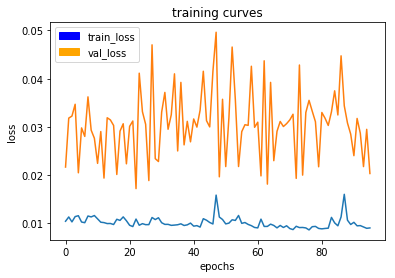

50/50 [==============================] - 76s - loss: 0.0091 - val_loss: 0.0204
Epoch 97/400
49/50 [============================>.] - ETA: 1s - loss: 0.0118

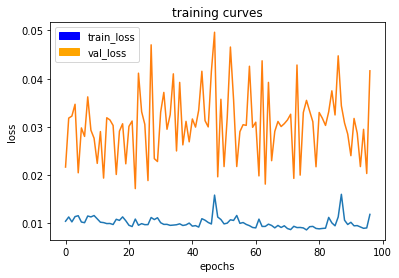

50/50 [==============================] - 77s - loss: 0.0119 - val_loss: 0.0416
Epoch 98/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

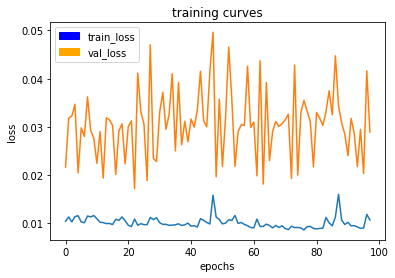

50/50 [==============================] - 77s - loss: 0.0107 - val_loss: 0.0289
Epoch 99/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

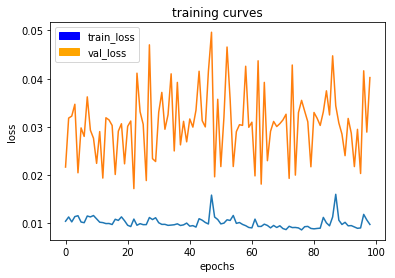

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0402
Epoch 100/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

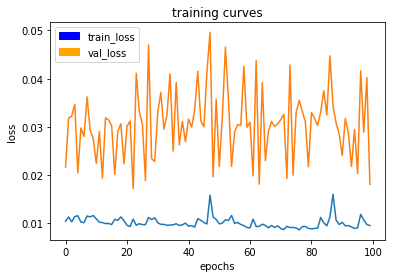

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0181
Epoch 101/400
49/50 [============================>.] - ETA: 1s - loss: 0.0109

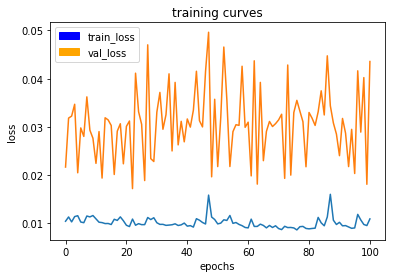

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0436
Epoch 102/400
49/50 [============================>.] - ETA: 1s - loss: 0.0104

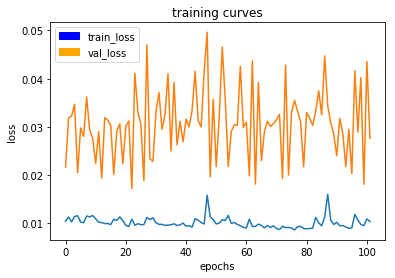

50/50 [==============================] - 77s - loss: 0.0104 - val_loss: 0.0276
Epoch 103/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

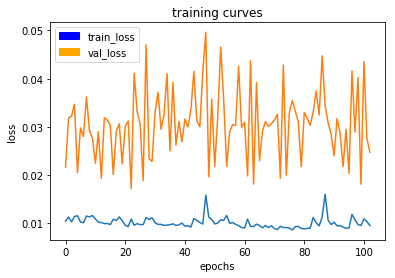

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0248
Epoch 104/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

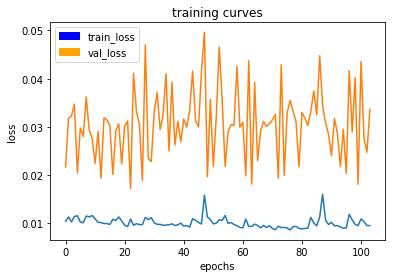

50/50 [==============================] - 76s - loss: 0.0095 - val_loss: 0.0336
Epoch 105/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

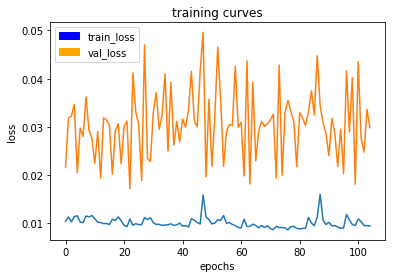

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0298
Epoch 106/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

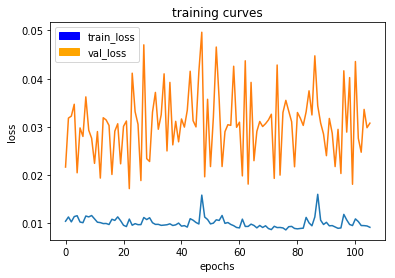

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0308
Epoch 107/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

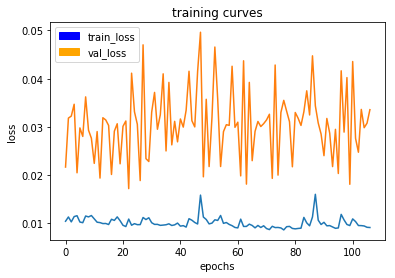

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0336
Epoch 108/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

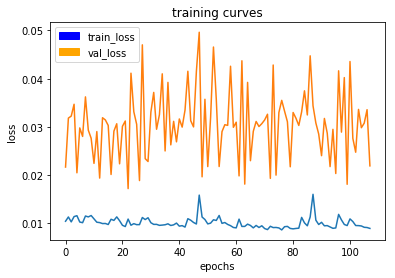

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0219
Epoch 109/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

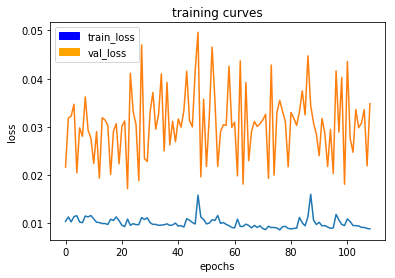

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0348
Epoch 110/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

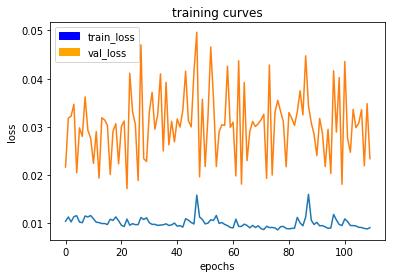

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0234
Epoch 111/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

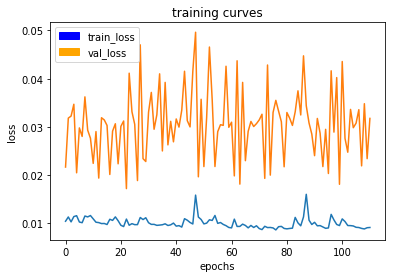

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0318
Epoch 112/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

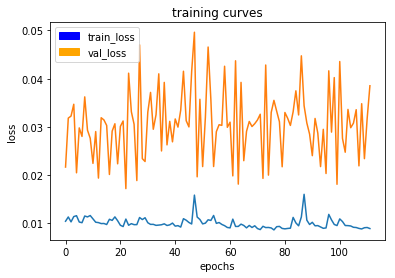

50/50 [==============================] - 76s - loss: 0.0089 - val_loss: 0.0385
Epoch 113/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

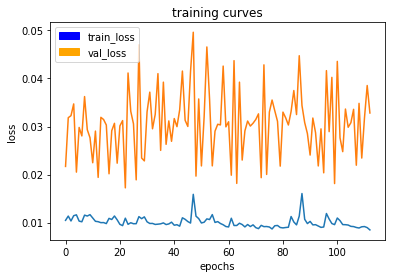

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0328
Epoch 114/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

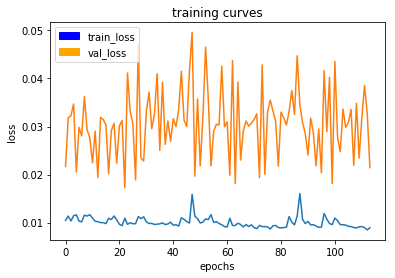

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0214
Epoch 115/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

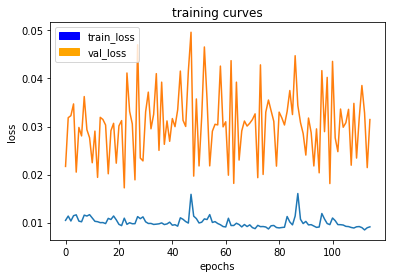

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0314
Epoch 116/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

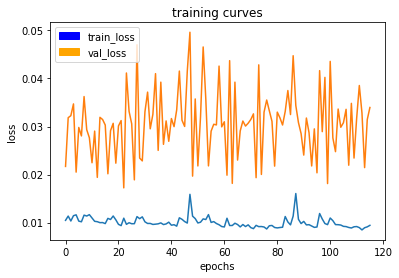

50/50 [==============================] - 76s - loss: 0.0094 - val_loss: 0.0340
Epoch 117/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

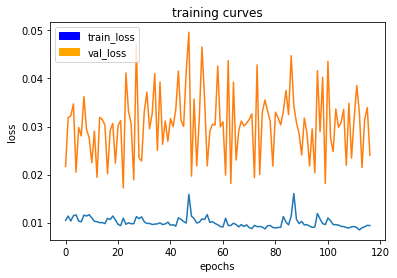

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0240
Epoch 118/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

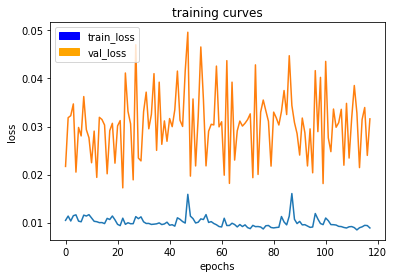

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0316
Epoch 119/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

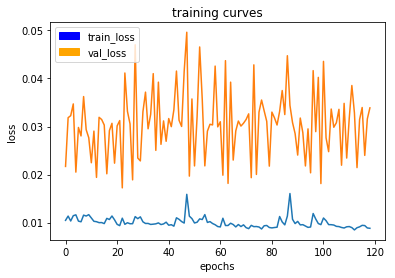

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0339
Epoch 120/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

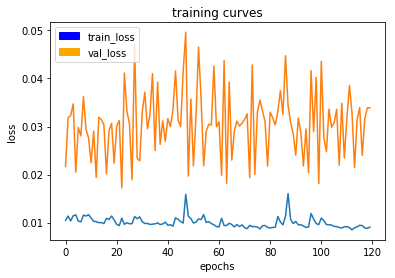

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0339
Epoch 121/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

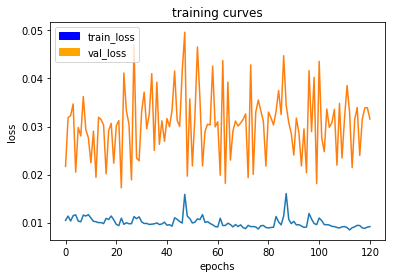

50/50 [==============================] - 76s - loss: 0.0092 - val_loss: 0.0316
Epoch 122/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

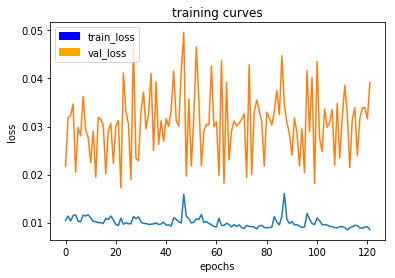

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0391
Epoch 123/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

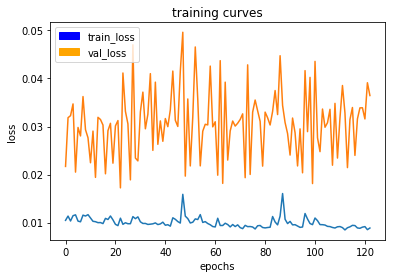

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0364
Epoch 124/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

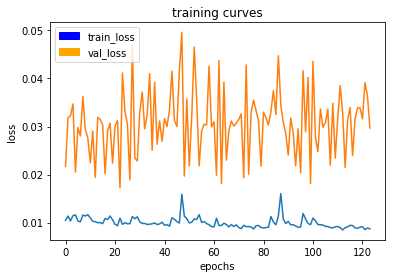

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0297
Epoch 125/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

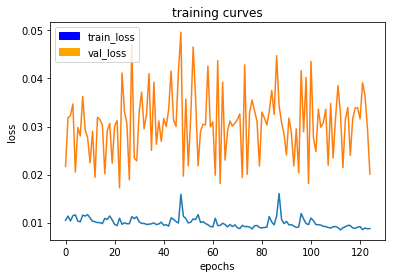

50/50 [==============================] - 76s - loss: 0.0087 - val_loss: 0.0201
Epoch 126/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

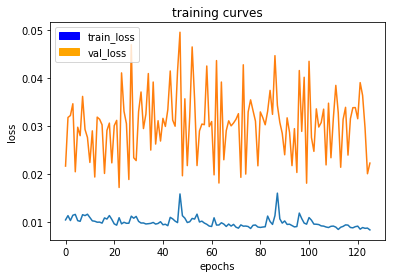

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0223
Epoch 127/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

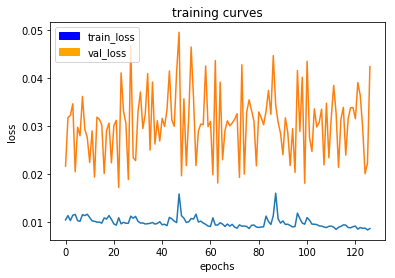

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0424
Epoch 128/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

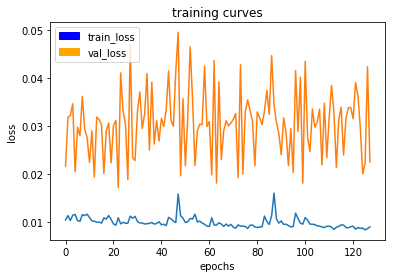

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0225
Epoch 129/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

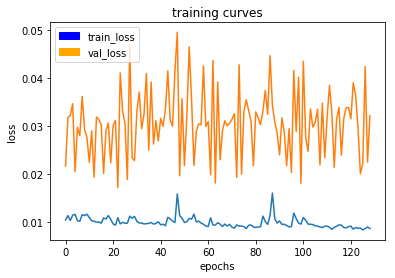

50/50 [==============================] - 76s - loss: 0.0087 - val_loss: 0.0322
Epoch 130/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

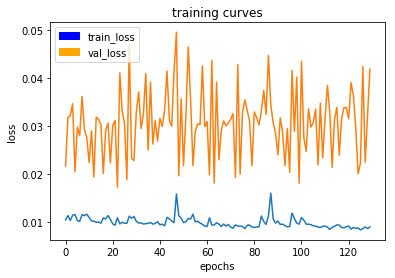

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0419
Epoch 131/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

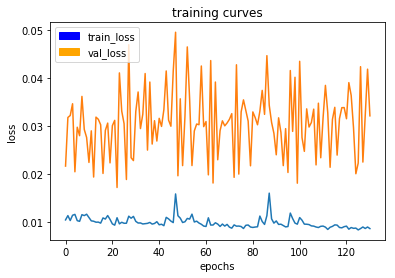

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0322
Epoch 132/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

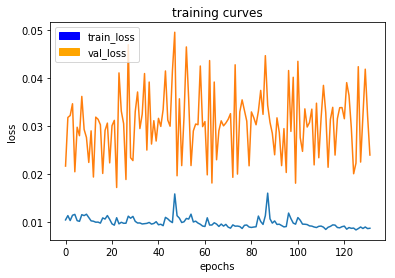

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0240
Epoch 133/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

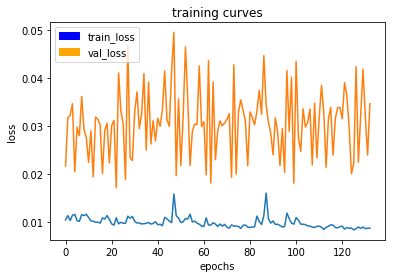

50/50 [==============================] - 76s - loss: 0.0087 - val_loss: 0.0347
Epoch 134/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

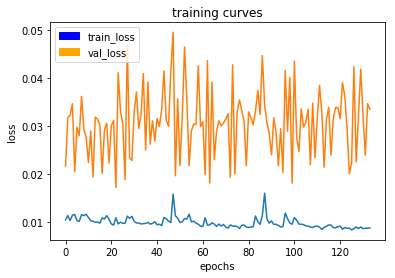

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0336
Epoch 135/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

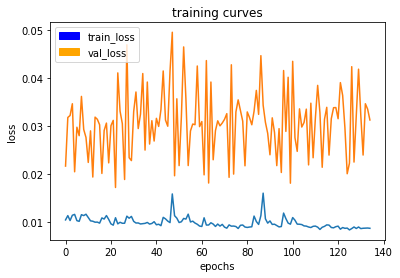

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0313
Epoch 136/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

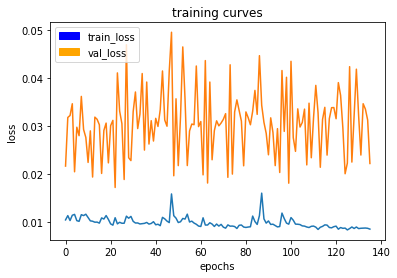

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0222
Epoch 137/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

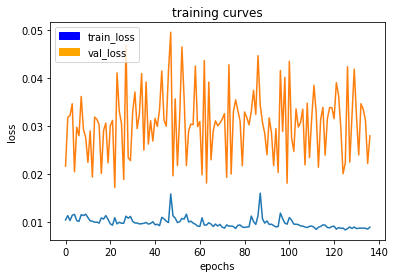

50/50 [==============================] - 76s - loss: 0.0089 - val_loss: 0.0280
Epoch 138/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

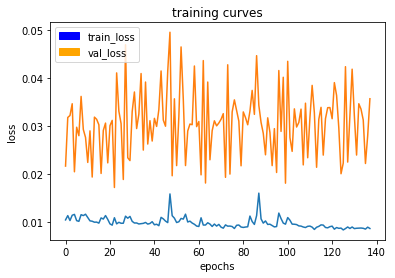

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0357
Epoch 139/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

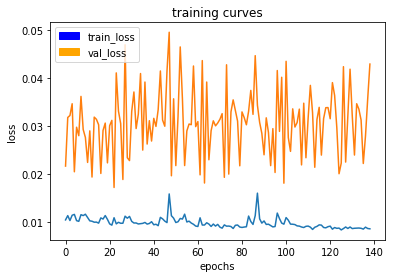

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0430
Epoch 140/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

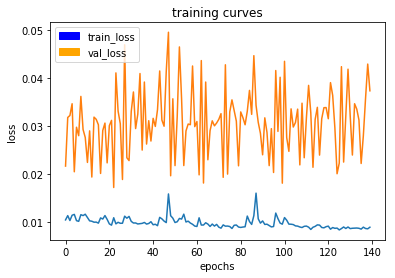

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0374
Epoch 141/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

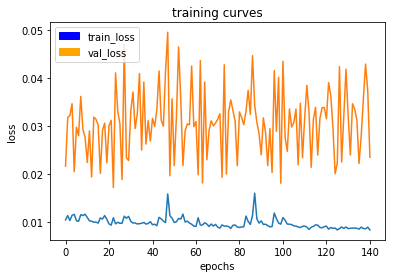

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0235
Epoch 142/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

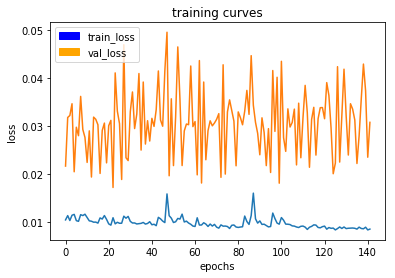

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0308
Epoch 143/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

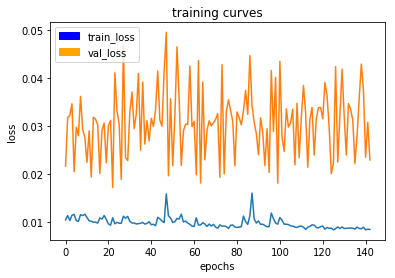

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0230
Epoch 144/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

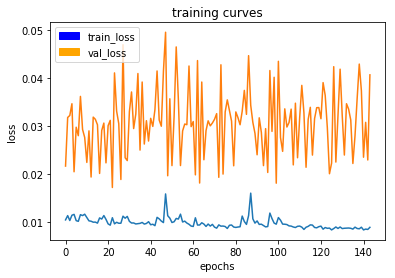

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0407
Epoch 145/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

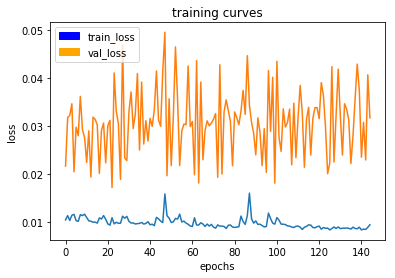

50/50 [==============================] - 76s - loss: 0.0094 - val_loss: 0.0317
Epoch 146/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

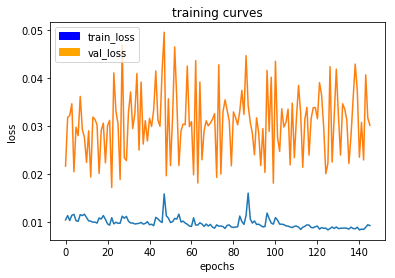

50/50 [==============================] - 77s - loss: 0.0093 - val_loss: 0.0302
Epoch 147/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

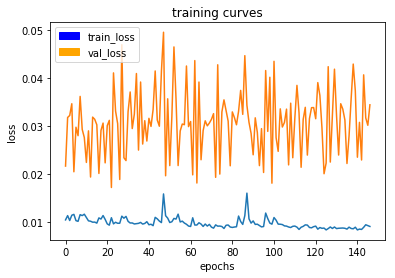

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0345
Epoch 148/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

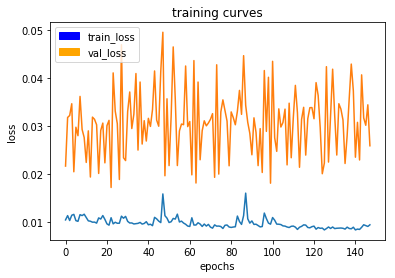

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0259
Epoch 149/400
49/50 [============================>.] - ETA: 1s - loss: 0.0098

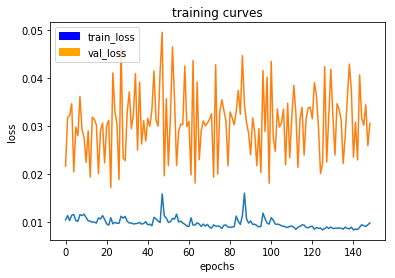

50/50 [==============================] - 77s - loss: 0.0098 - val_loss: 0.0306
Epoch 150/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

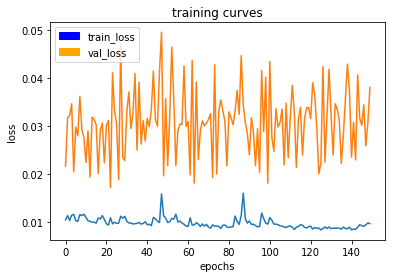

50/50 [==============================] - 76s - loss: 0.0097 - val_loss: 0.0381
Epoch 151/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

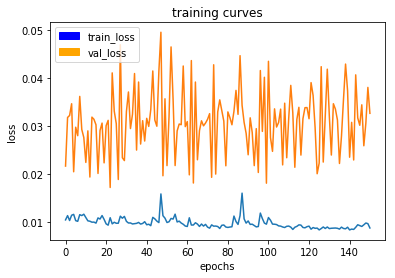

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0327
Epoch 152/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

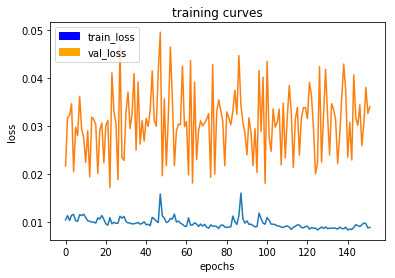

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0341
Epoch 153/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

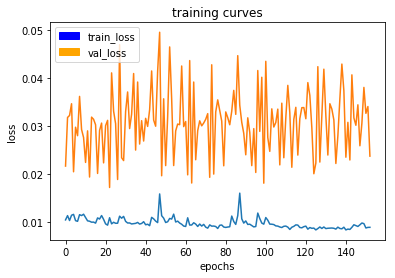

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0238
Epoch 154/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

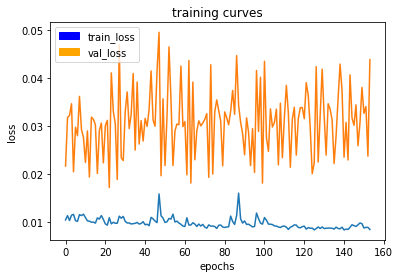

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0439
Epoch 155/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

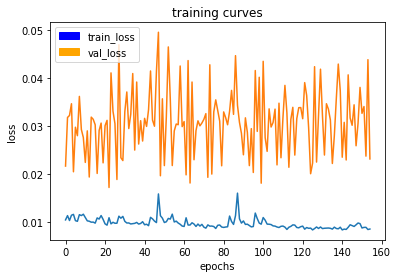

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0232
Epoch 156/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

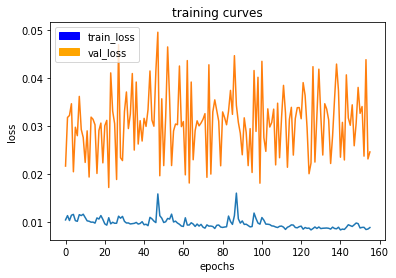

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0246
Epoch 157/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

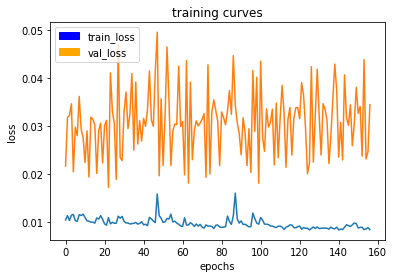

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0345
Epoch 158/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

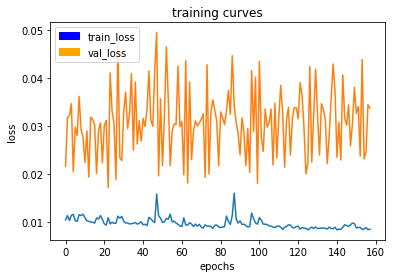

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0338
Epoch 159/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

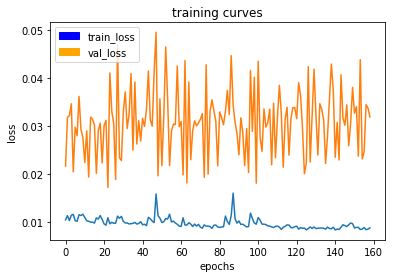

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0319
Epoch 160/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

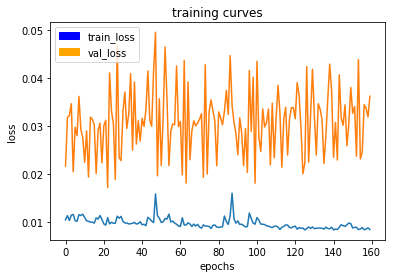

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0363
Epoch 161/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

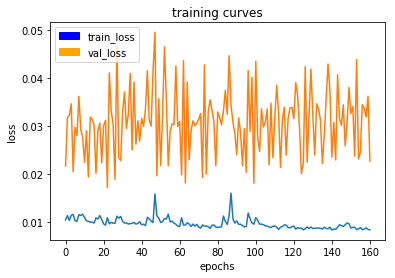

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0227
Epoch 162/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

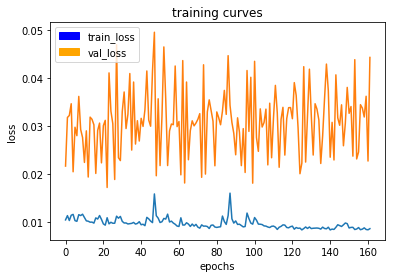

50/50 [==============================] - 76s - loss: 0.0086 - val_loss: 0.0444
Epoch 163/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

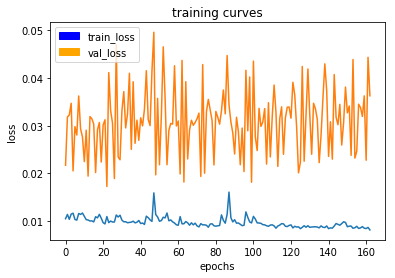

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0363
Epoch 164/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

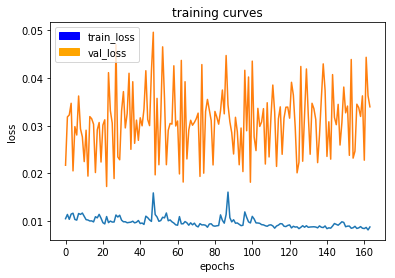

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0340
Epoch 165/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

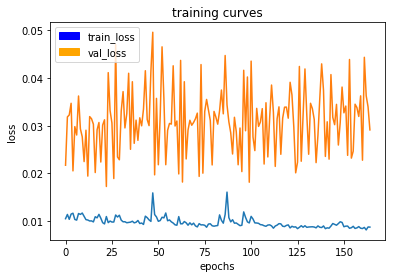

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0291
Epoch 166/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

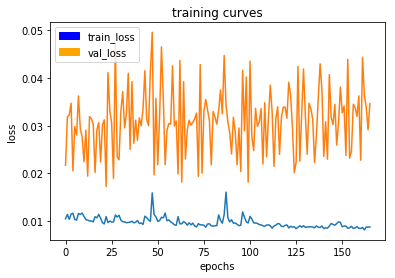

50/50 [==============================] - 76s - loss: 0.0087 - val_loss: 0.0346
Epoch 167/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

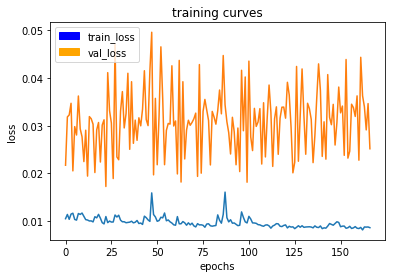

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0251
Epoch 168/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

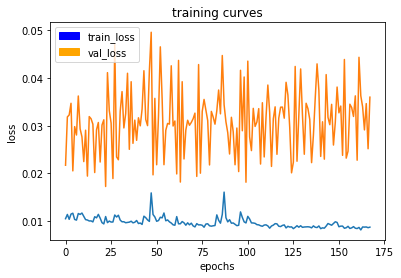

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0360
Epoch 169/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

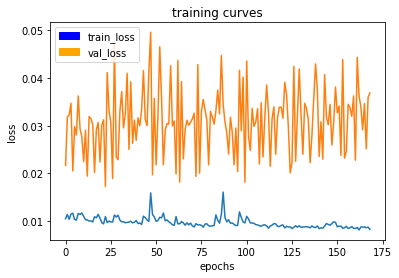

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0369
Epoch 170/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

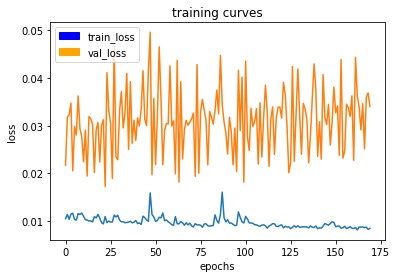

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0340
Epoch 171/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

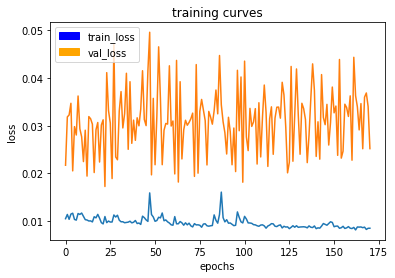

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0252
Epoch 172/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

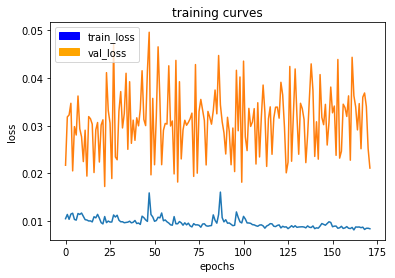

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0211
Epoch 173/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

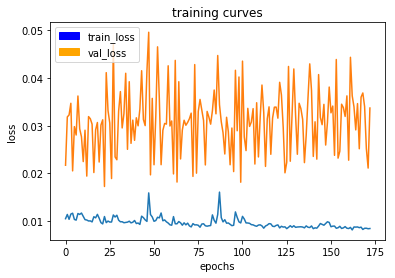

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0337
Epoch 174/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

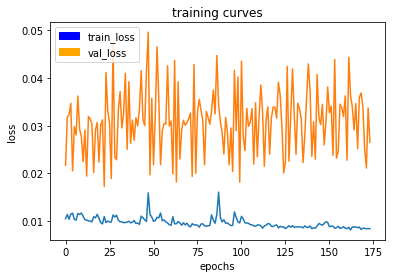

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0265
Epoch 175/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

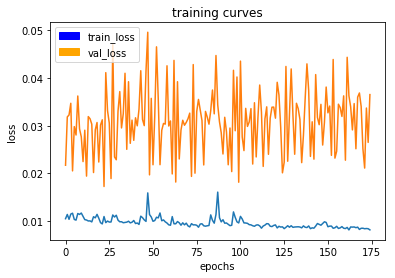

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0365
Epoch 176/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

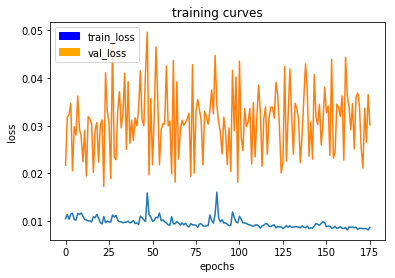

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0301
Epoch 177/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

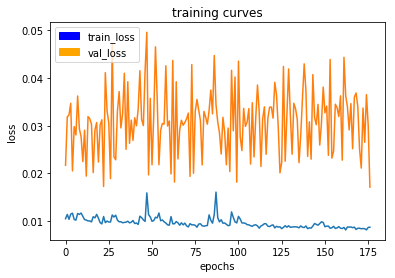

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0171
Epoch 178/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

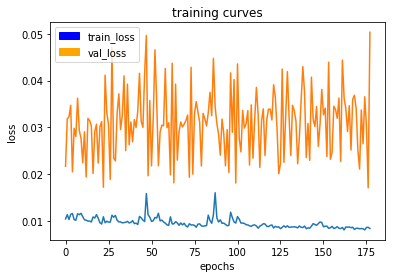

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0503
Epoch 179/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

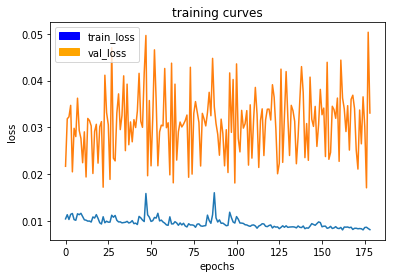

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0331
Epoch 180/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

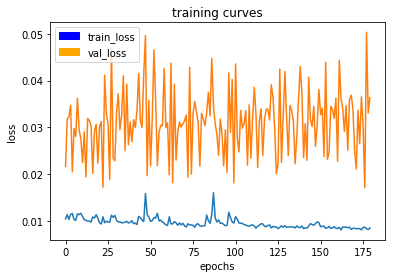

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0363
Epoch 181/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

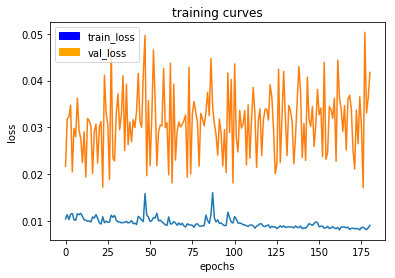

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0417
Epoch 182/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

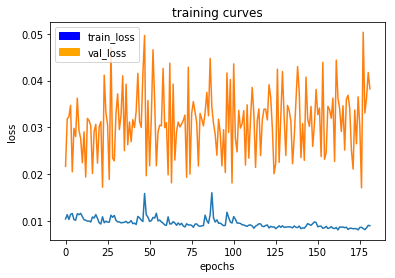

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0382
Epoch 183/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

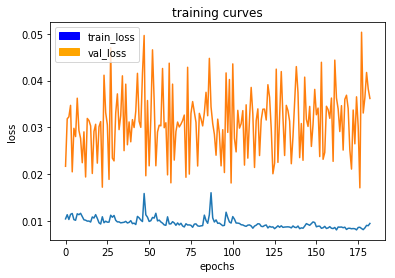

50/50 [==============================] - 76s - loss: 0.0095 - val_loss: 0.0362
Epoch 184/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

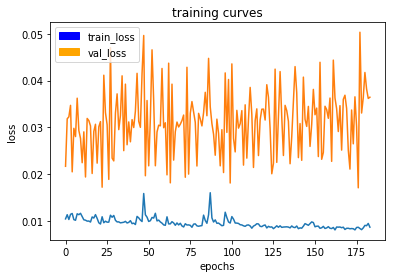

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0364
Epoch 185/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

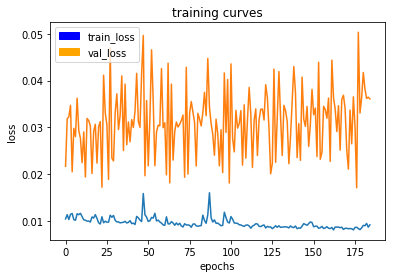

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0361
Epoch 186/400
49/50 [============================>.] - ETA: 1s - loss: 0.0093

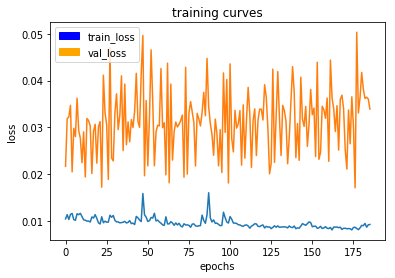

50/50 [==============================] - 77s - loss: 0.0093 - val_loss: 0.0339
Epoch 187/400
49/50 [============================>.] - ETA: 1s - loss: 0.0111

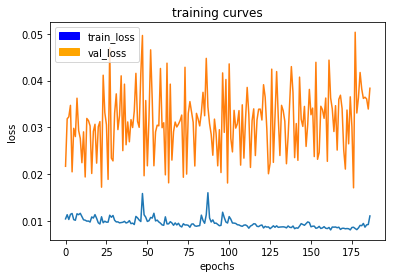

50/50 [==============================] - 76s - loss: 0.0111 - val_loss: 0.0384
Epoch 188/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

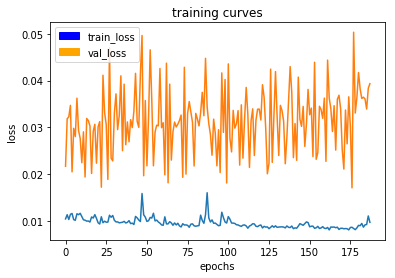

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0393
Epoch 189/400
49/50 [============================>.] - ETA: 1s - loss: 0.0091

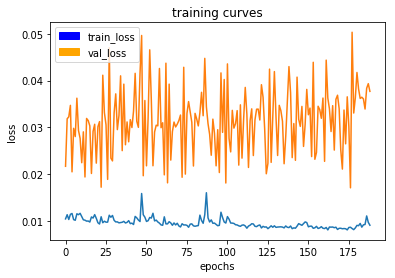

50/50 [==============================] - 77s - loss: 0.0091 - val_loss: 0.0377
Epoch 190/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

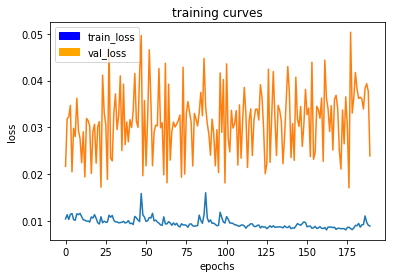

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0239
Epoch 191/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

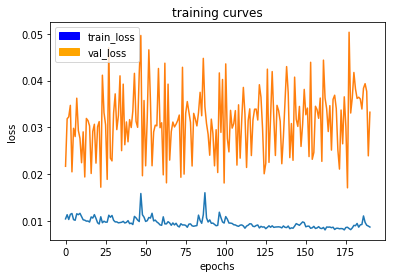

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0332
Epoch 192/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

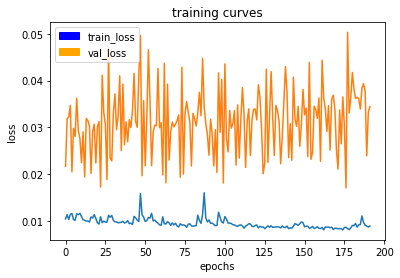

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0344
Epoch 193/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

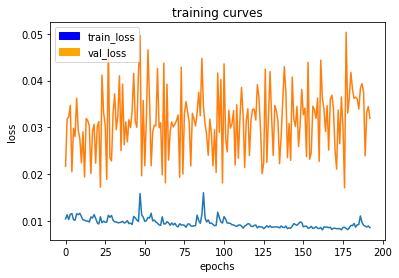

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0319
Epoch 194/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

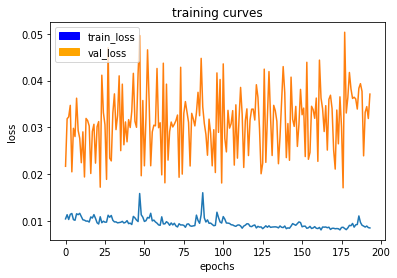

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0371
Epoch 195/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

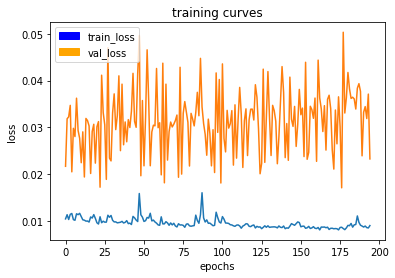

50/50 [==============================] - 76s - loss: 0.0090 - val_loss: 0.0233
Epoch 196/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

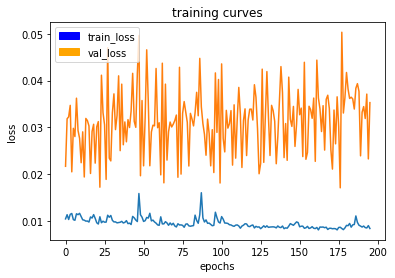

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0353
Epoch 197/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

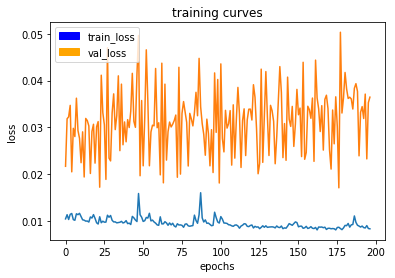

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0365
Epoch 198/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

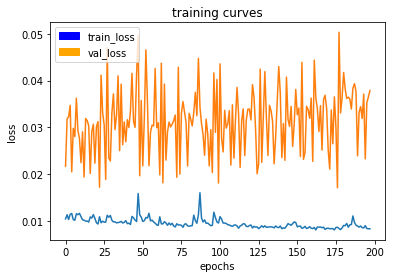

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0379
Epoch 199/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

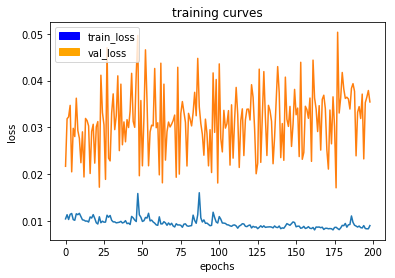

50/50 [==============================] - 76s - loss: 0.0090 - val_loss: 0.0354
Epoch 200/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

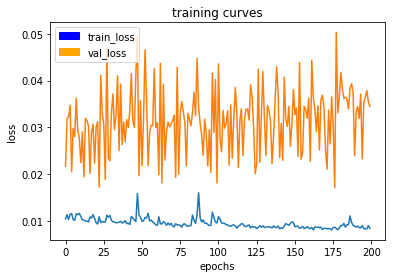

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0345
Epoch 201/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

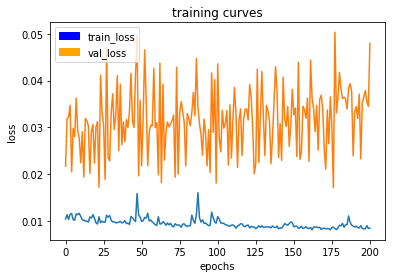

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0479
Epoch 202/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

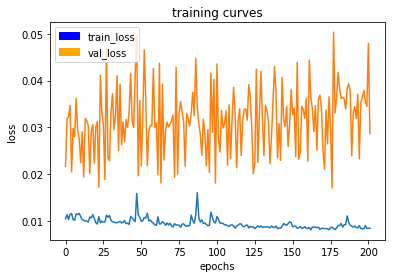

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0287
Epoch 203/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

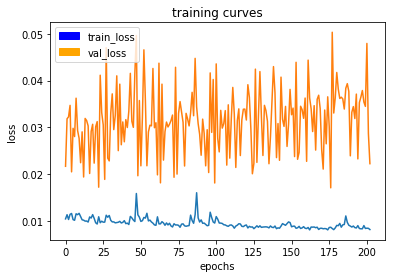

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0222
Epoch 204/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

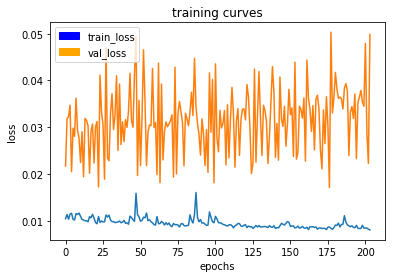

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0498
Epoch 205/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

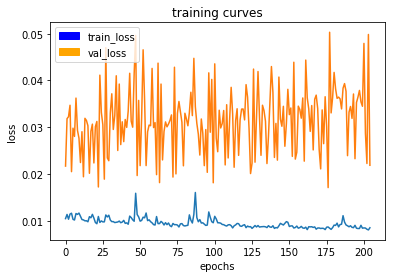

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0219
Epoch 206/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

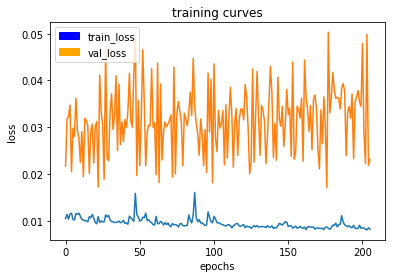

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0231
Epoch 207/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

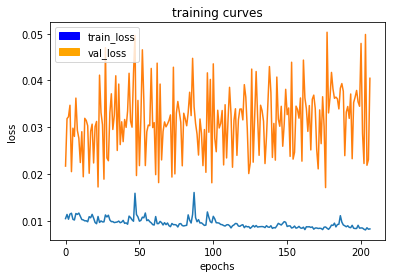

50/50 [==============================] - 76s - loss: 0.0083 - val_loss: 0.0405
Epoch 208/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

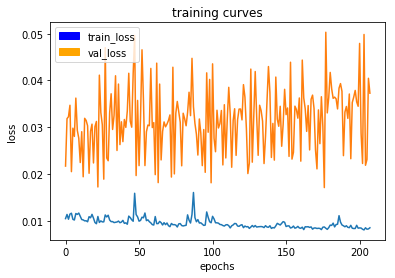

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0373
Epoch 209/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

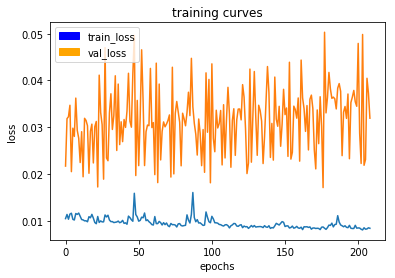

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0319
Epoch 210/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

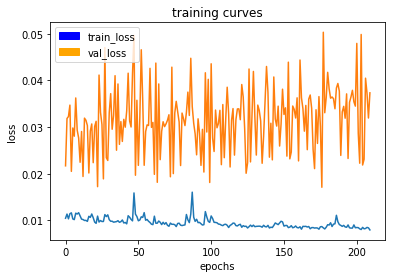

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0373
Epoch 211/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

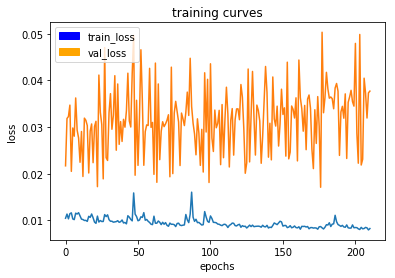

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0377
Epoch 212/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

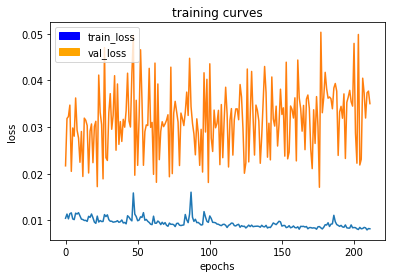

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0350
Epoch 213/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

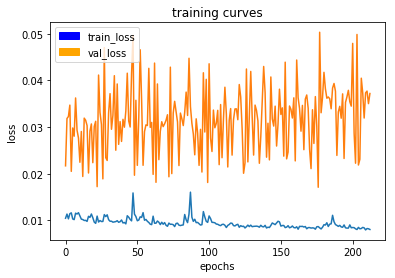

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0372
Epoch 214/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

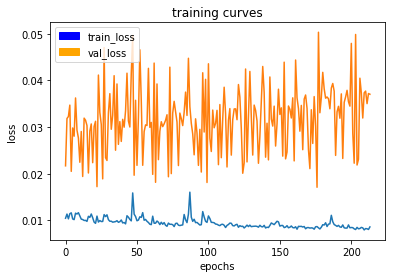

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0370
Epoch 215/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

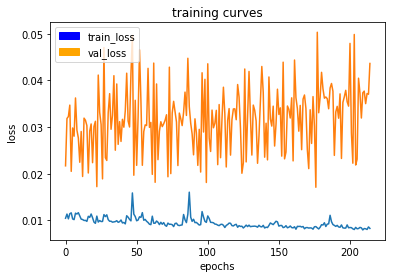

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0436
Epoch 216/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

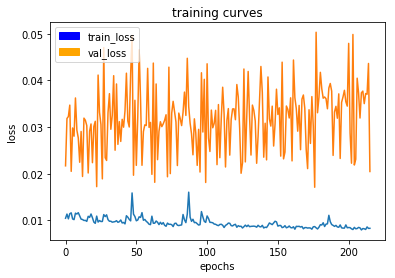

50/50 [==============================] - 76s - loss: 0.0083 - val_loss: 0.0205
Epoch 217/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

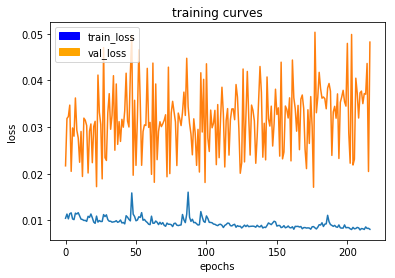

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0482
Epoch 218/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

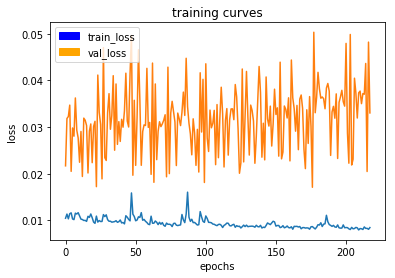

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0330
Epoch 219/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

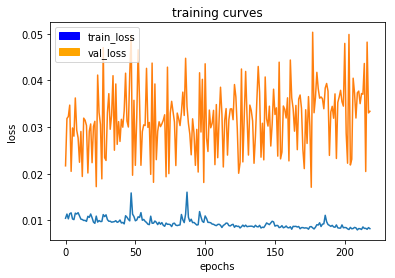

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0334
Epoch 220/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

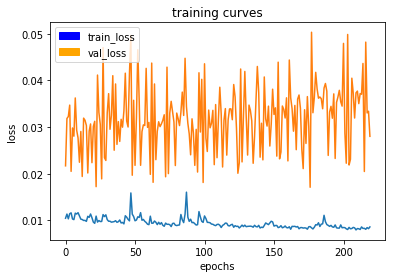

50/50 [==============================] - 76s - loss: 0.0086 - val_loss: 0.0280
Epoch 221/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

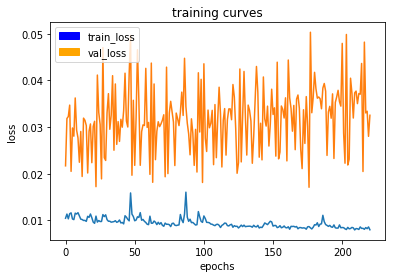

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0325
Epoch 222/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

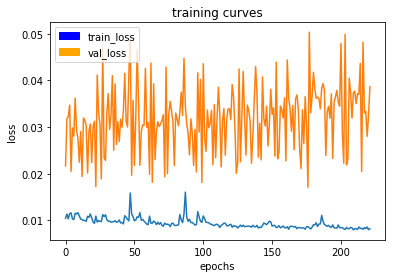

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0386
Epoch 223/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

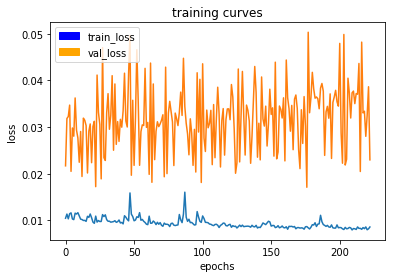

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0230
Epoch 224/400
49/50 [============================>.] - ETA: 1s - loss: 0.0097

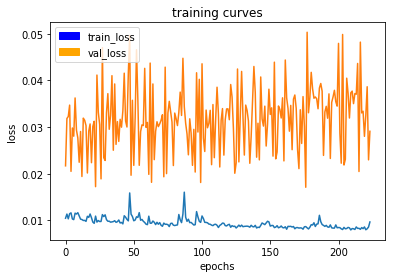

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0291
Epoch 225/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

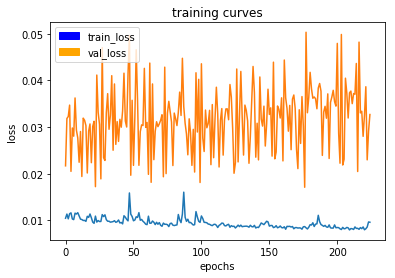

50/50 [==============================] - 77s - loss: 0.0096 - val_loss: 0.0327
Epoch 226/400
49/50 [============================>.] - ETA: 1s - loss: 0.0103

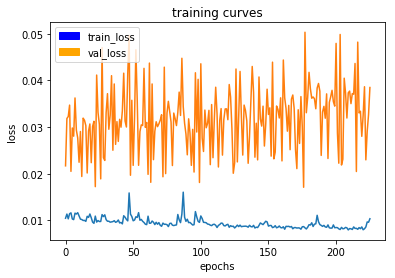

50/50 [==============================] - 77s - loss: 0.0103 - val_loss: 0.0385
Epoch 227/400
49/50 [============================>.] - ETA: 1s - loss: 0.0100

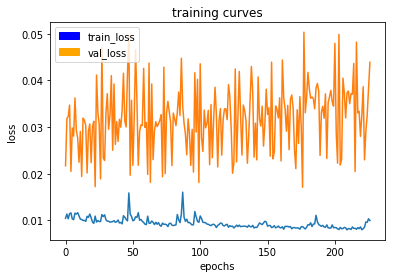

50/50 [==============================] - 77s - loss: 0.0100 - val_loss: 0.0439
Epoch 228/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

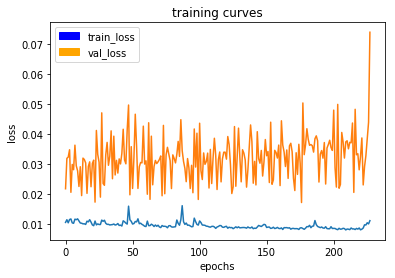

50/50 [==============================] - 76s - loss: 0.0110 - val_loss: 0.0739
Epoch 229/400
49/50 [============================>.] - ETA: 1s - loss: 0.0135

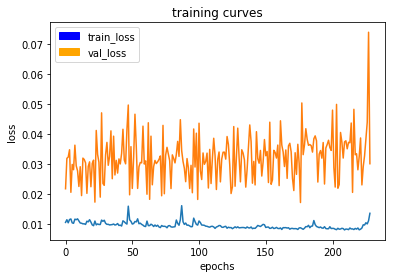

50/50 [==============================] - 77s - loss: 0.0135 - val_loss: 0.0300
Epoch 230/400
49/50 [============================>.] - ETA: 1s - loss: 0.0111

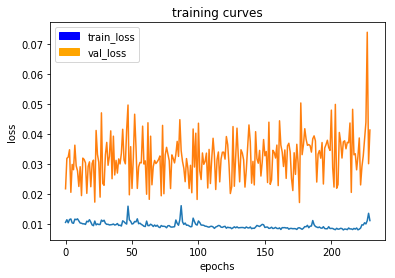

50/50 [==============================] - 77s - loss: 0.0111 - val_loss: 0.0413
Epoch 231/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

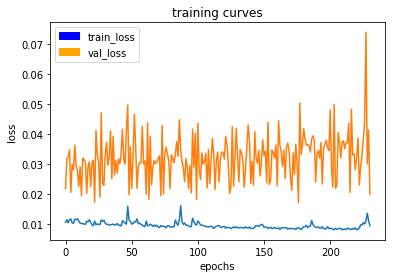

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0198
Epoch 232/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

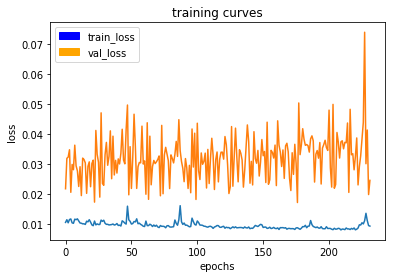

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0245
Epoch 233/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

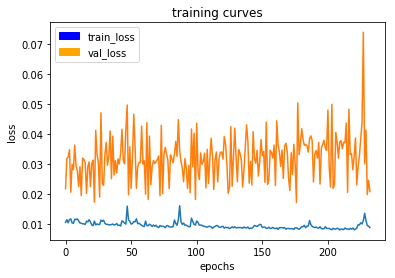

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0208
Epoch 234/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

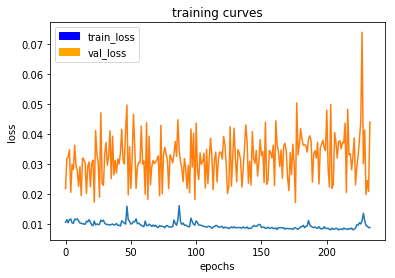

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0440
Epoch 235/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

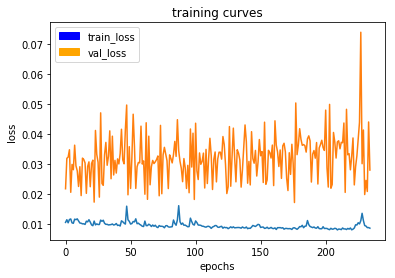

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0279
Epoch 236/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

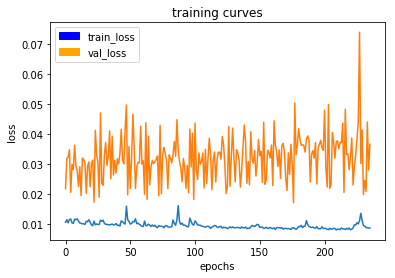

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0365
Epoch 237/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

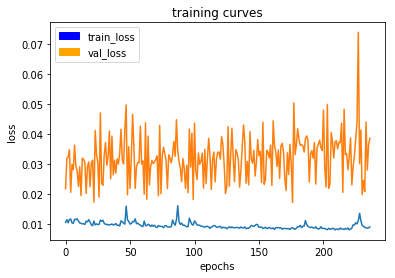

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0386
Epoch 238/400
49/50 [============================>.] - ETA: 1s - loss: 0.0112

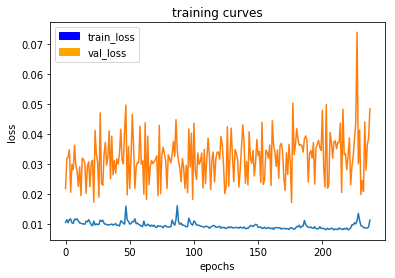

50/50 [==============================] - 77s - loss: 0.0112 - val_loss: 0.0483
Epoch 239/400
49/50 [============================>.] - ETA: 1s - loss: 0.0103

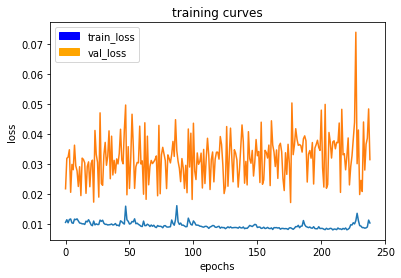

50/50 [==============================] - 77s - loss: 0.0103 - val_loss: 0.0314
Epoch 240/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

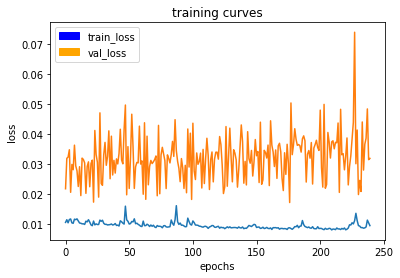

50/50 [==============================] - 77s - loss: 0.0094 - val_loss: 0.0318
Epoch 241/400
49/50 [============================>.] - ETA: 1s - loss: 0.0127

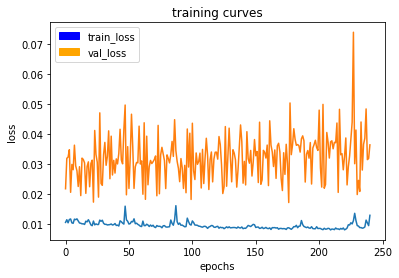

50/50 [==============================] - 76s - loss: 0.0128 - val_loss: 0.0363
Epoch 242/400
49/50 [============================>.] - ETA: 1s - loss: 0.0099

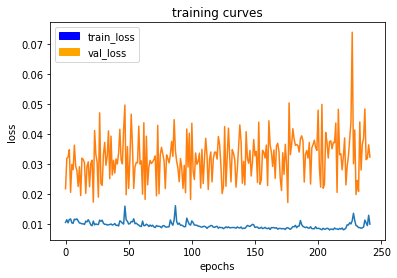

50/50 [==============================] - 77s - loss: 0.0099 - val_loss: 0.0323
Epoch 243/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

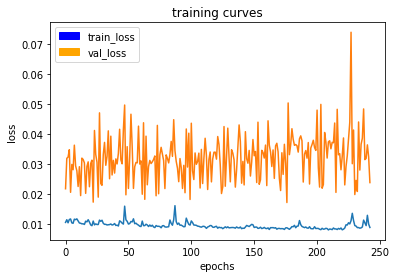

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0237
Epoch 244/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

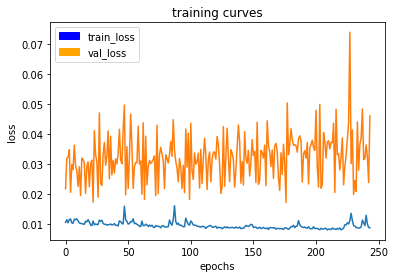

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0460
Epoch 245/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

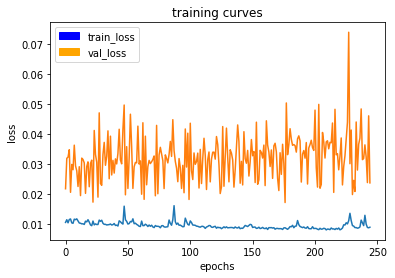

50/50 [==============================] - 77s - loss: 0.0088 - val_loss: 0.0236
Epoch 246/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

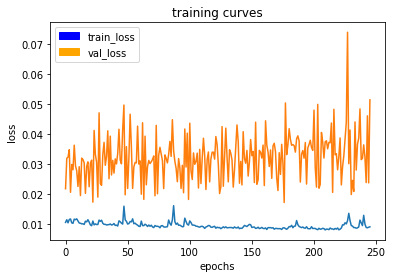

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0514
Epoch 247/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

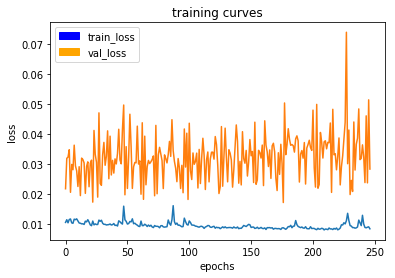

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0283
Epoch 248/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

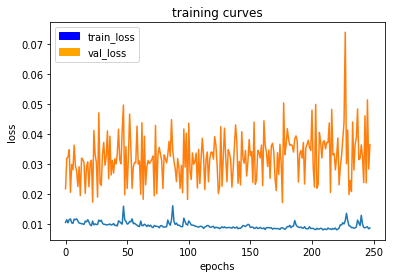

50/50 [==============================] - 77s - loss: 0.0086 - val_loss: 0.0364
Epoch 249/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

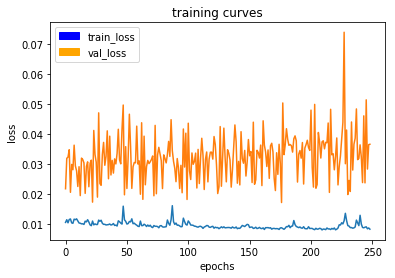

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0365
Epoch 250/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

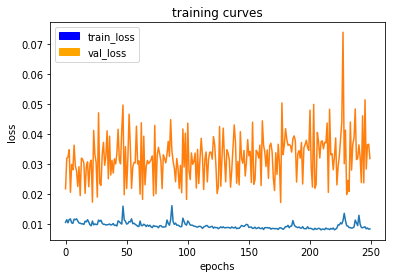

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0318
Epoch 251/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

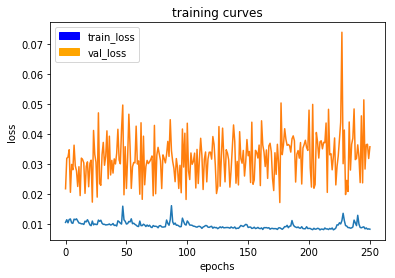

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0357
Epoch 252/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

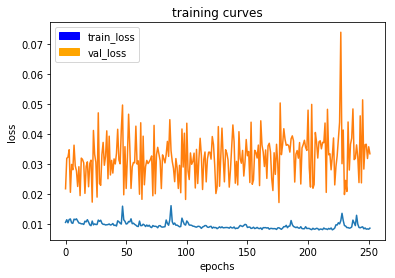

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0334
Epoch 253/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

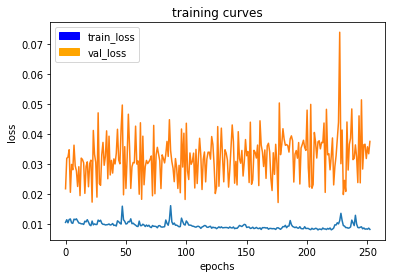

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0375
Epoch 254/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

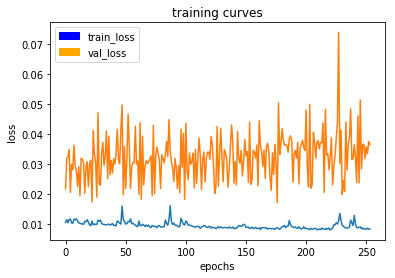

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0364
Epoch 255/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

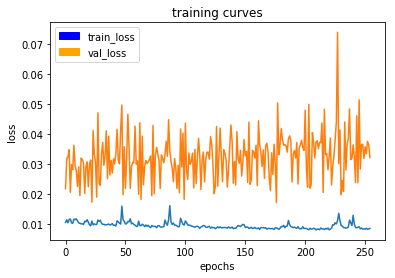

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0321
Epoch 256/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

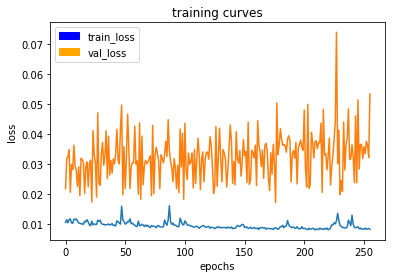

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0533
Epoch 257/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

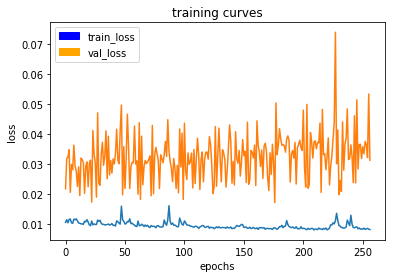

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0312
Epoch 258/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

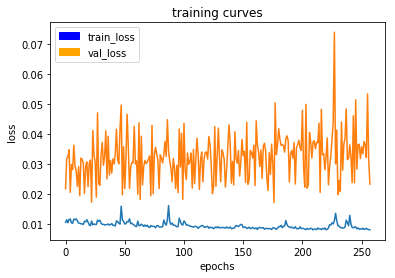

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0232
Epoch 259/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

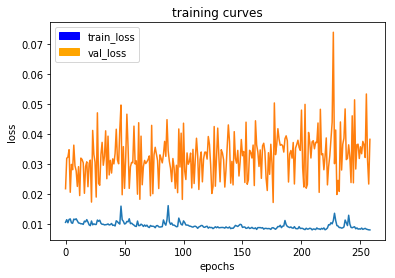

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0382
Epoch 260/400
49/50 [============================>.] - ETA: 1s - loss: 0.0086

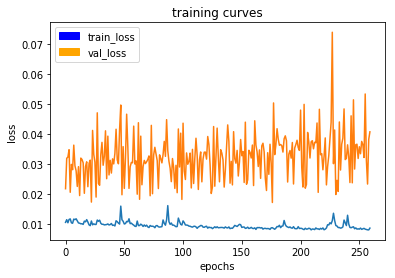

50/50 [==============================] - 77s - loss: 0.0085 - val_loss: 0.0407
Epoch 261/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

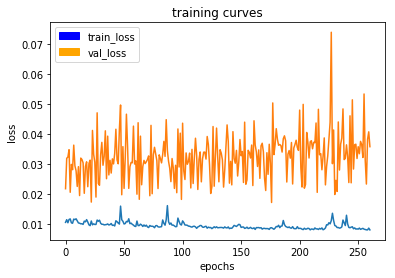

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0357
Epoch 262/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

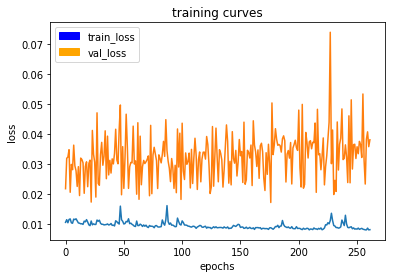

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0380
Epoch 263/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

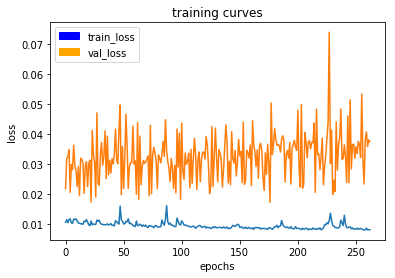

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0374
Epoch 264/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

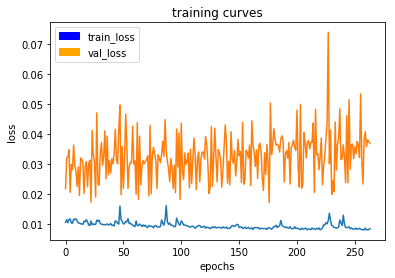

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0368
Epoch 265/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

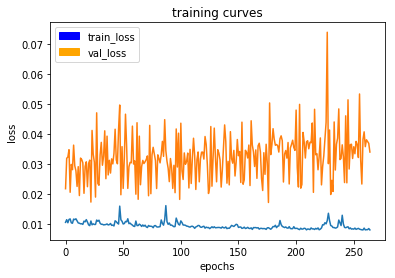

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0339
Epoch 266/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

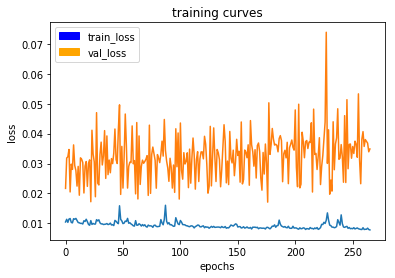

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0349
Epoch 267/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

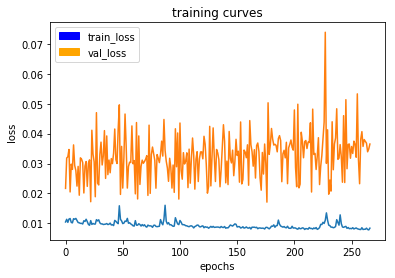

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0365
Epoch 268/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

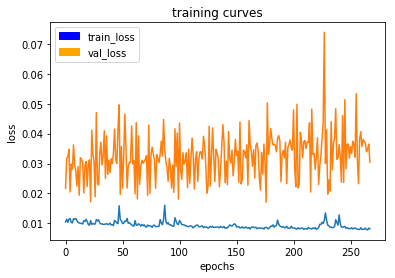

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0304
Epoch 269/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

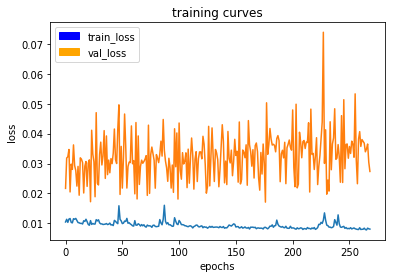

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0274
Epoch 270/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

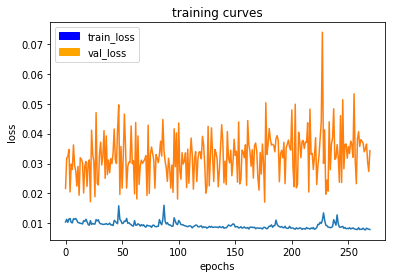

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0343
Epoch 271/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

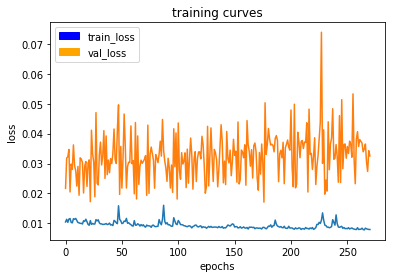

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0325
Epoch 272/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

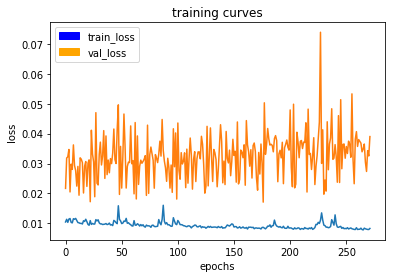

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0390
Epoch 273/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

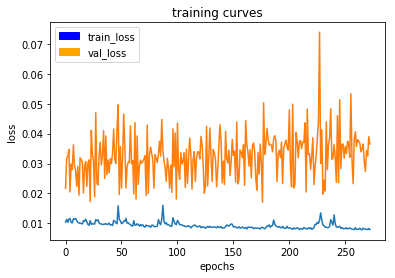

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0365
Epoch 274/400
49/50 [============================>.] - ETA: 1s - loss: 0.0085

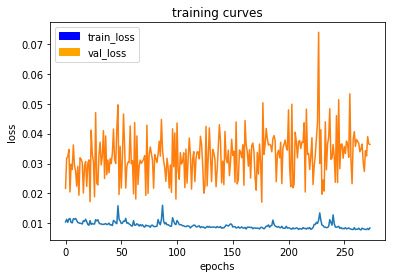

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0364
Epoch 275/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

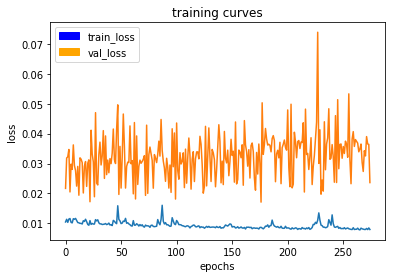

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0236
Epoch 276/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

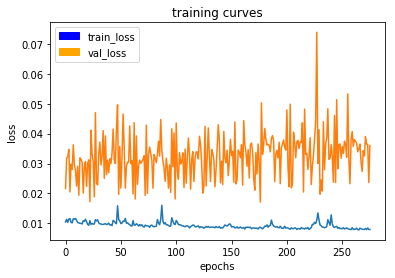

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0360
Epoch 277/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

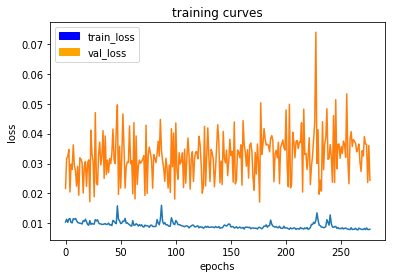

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0244
Epoch 278/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

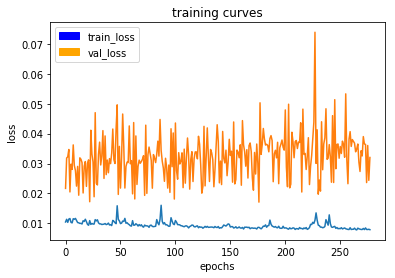

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0320
Epoch 279/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

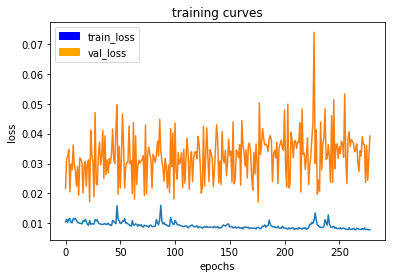

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0392
Epoch 280/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

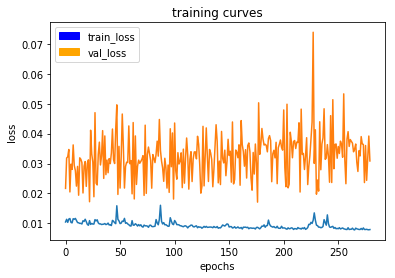

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0309
Epoch 281/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

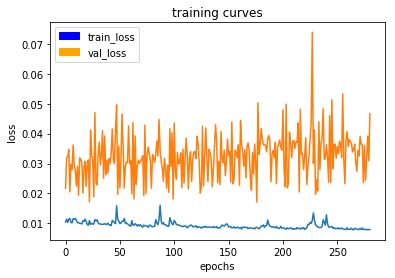

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0467
Epoch 282/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

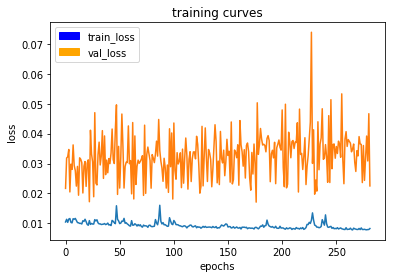

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0225
Epoch 283/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

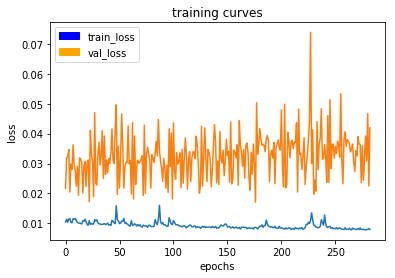

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0420
Epoch 284/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

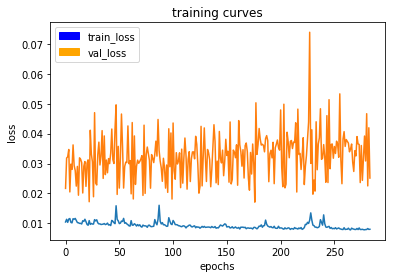

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0251
Epoch 285/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

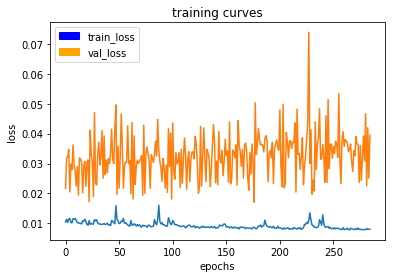

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0395
Epoch 286/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

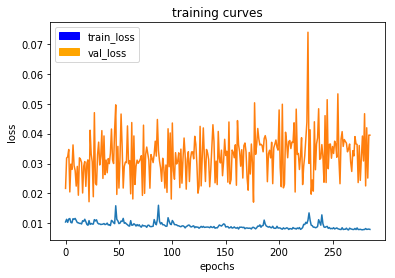

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0395
Epoch 287/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

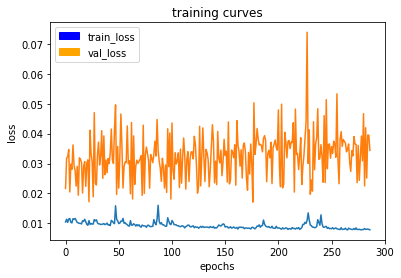

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0344
Epoch 288/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

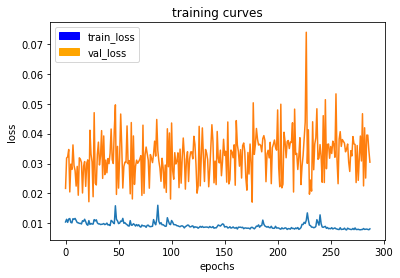

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0305
Epoch 289/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

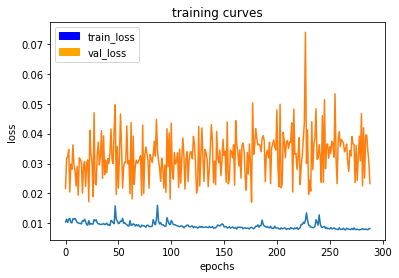

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0233
Epoch 290/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

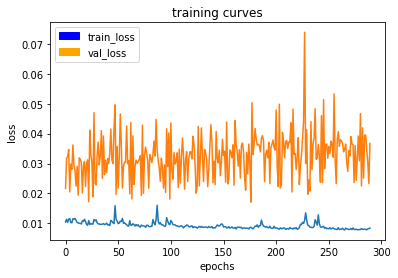

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0367
Epoch 291/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

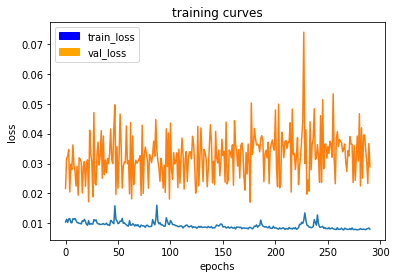

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0289
Epoch 292/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

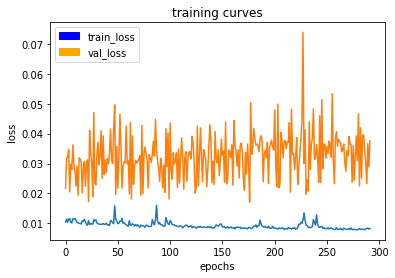

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0376
Epoch 293/400
49/50 [============================>.] - ETA: 1s - loss: 0.0087

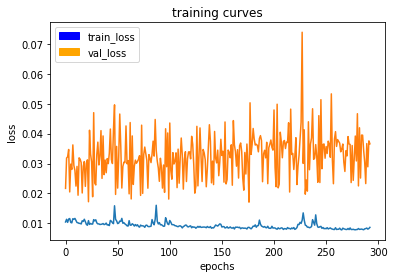

50/50 [==============================] - 77s - loss: 0.0087 - val_loss: 0.0366
Epoch 294/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

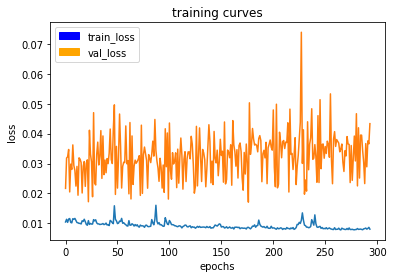

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0433
Epoch 295/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

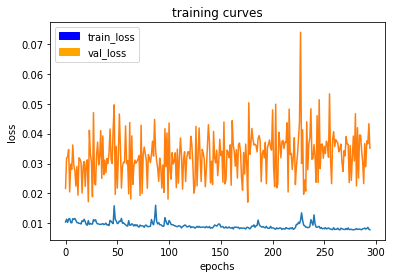

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0351
Epoch 296/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

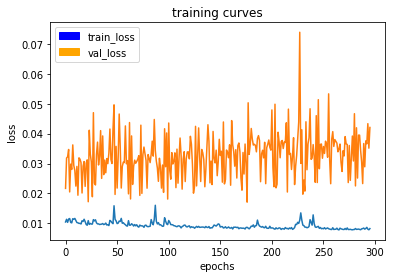

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0421
Epoch 297/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

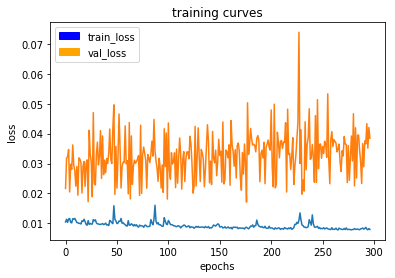

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0385
Epoch 298/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

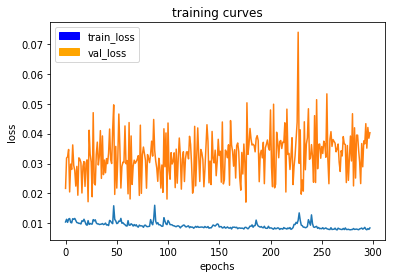

50/50 [==============================] - 76s - loss: 0.0085 - val_loss: 0.0403
Epoch 299/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

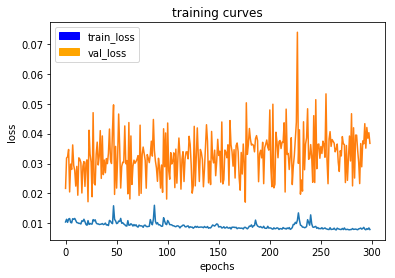

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0368
Epoch 300/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

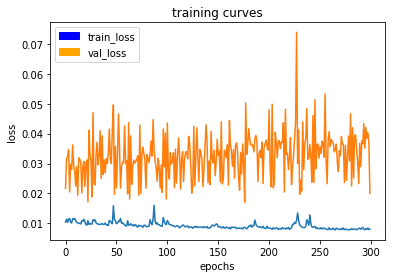

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0200
Epoch 301/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

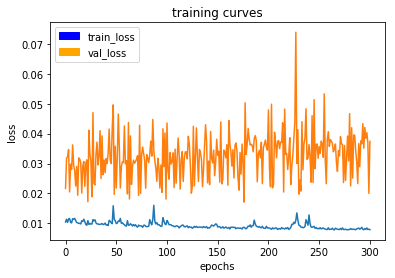

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0374
Epoch 302/400
49/50 [============================>.] - ETA: 1s - loss: 0.0096

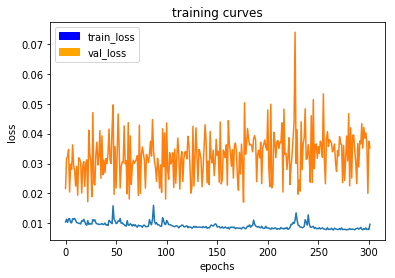

50/50 [==============================] - 77s - loss: 0.0097 - val_loss: 0.0353
Epoch 303/400
49/50 [============================>.] - ETA: 1s - loss: 0.0094

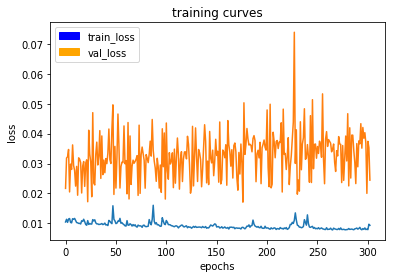

50/50 [==============================] - 77s - loss: 0.0093 - val_loss: 0.0244
Epoch 304/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

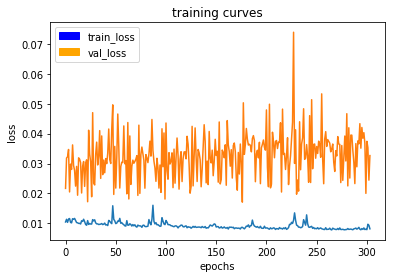

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0327
Epoch 305/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

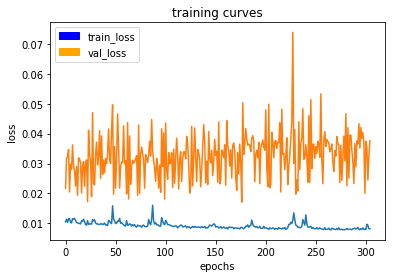

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0376
Epoch 306/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

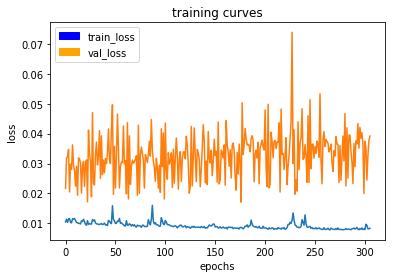

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0392
Epoch 307/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

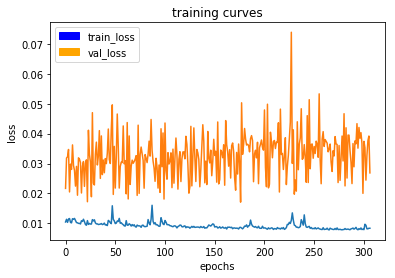

50/50 [==============================] - 76s - loss: 0.0083 - val_loss: 0.0269
Epoch 308/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

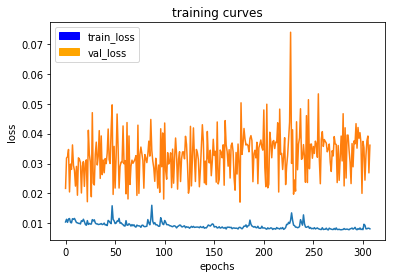

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0361
Epoch 309/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

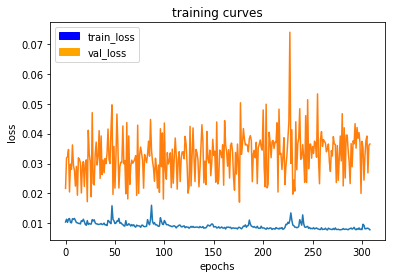

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0365
Epoch 310/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

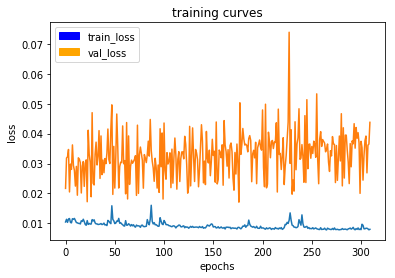

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0438
Epoch 311/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

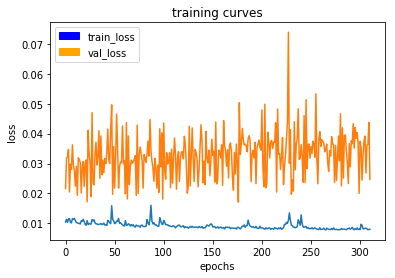

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0247
Epoch 312/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

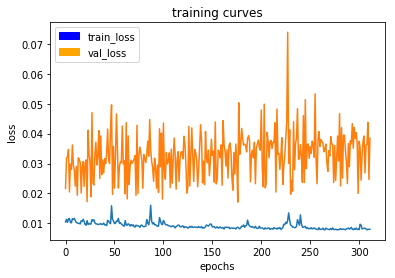

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0385
Epoch 313/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

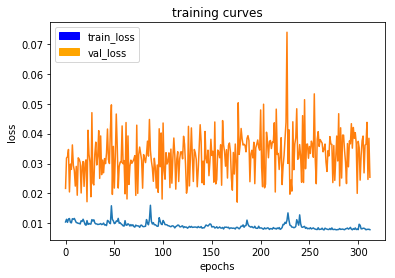

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0254
Epoch 314/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

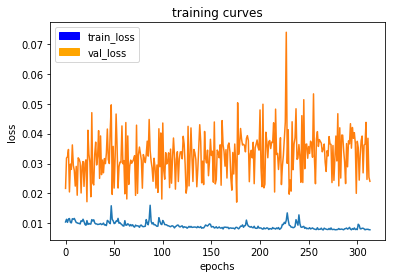

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0241
Epoch 315/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

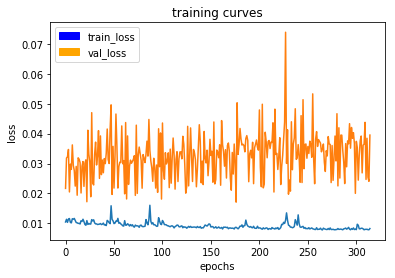

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0395
Epoch 316/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

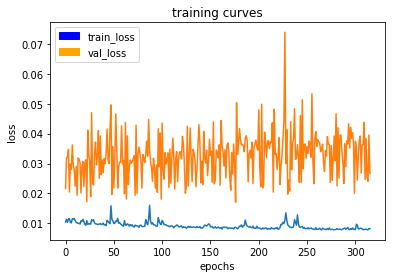

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0267
Epoch 317/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

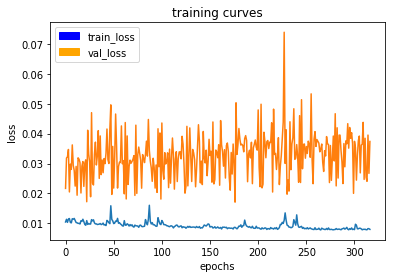

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0374
Epoch 318/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

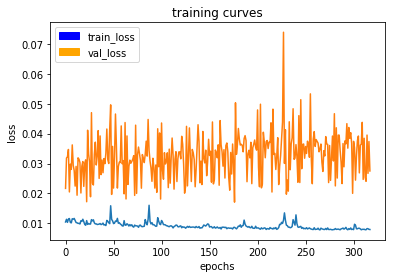

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0275
Epoch 319/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

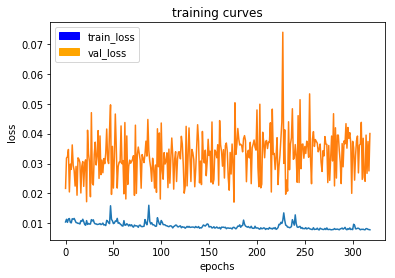

50/50 [==============================] - 76s - loss: 0.0078 - val_loss: 0.0400
Epoch 320/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

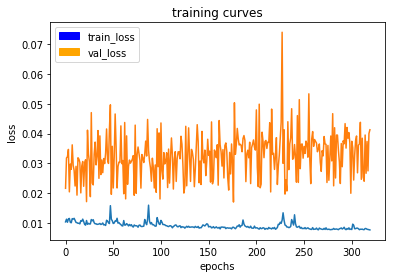

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0413
Epoch 321/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

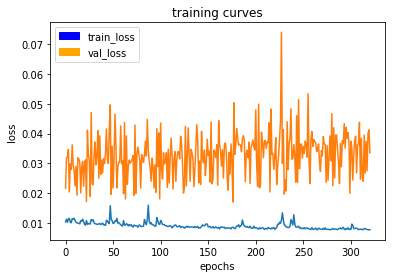

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0336
Epoch 322/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

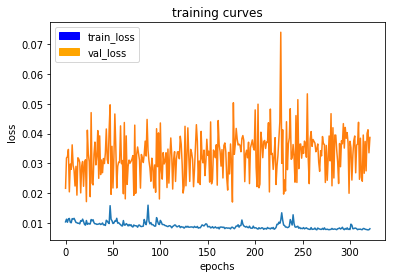

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0387
Epoch 323/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

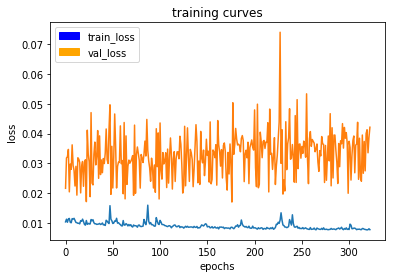

50/50 [==============================] - 76s - loss: 0.0078 - val_loss: 0.0421
Epoch 324/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

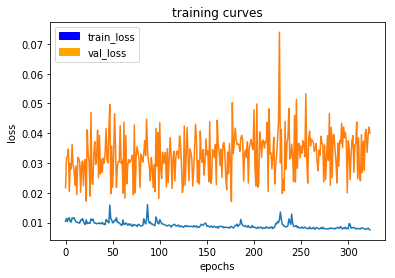

50/50 [==============================] - 77s - loss: 0.0075 - val_loss: 0.0400
Epoch 325/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

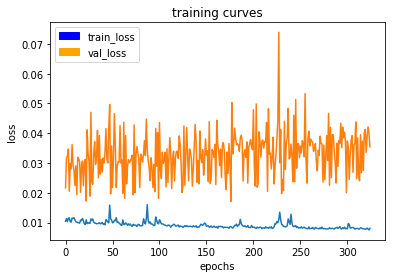

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0354
Epoch 326/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

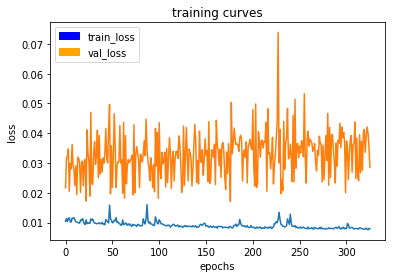

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0285
Epoch 327/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

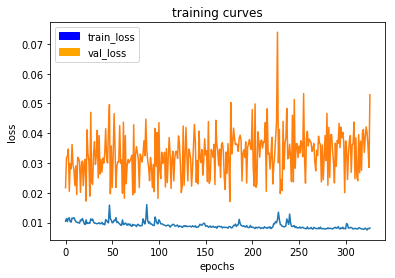

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0529
Epoch 328/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

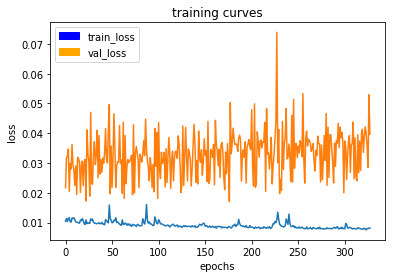

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0396
Epoch 329/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

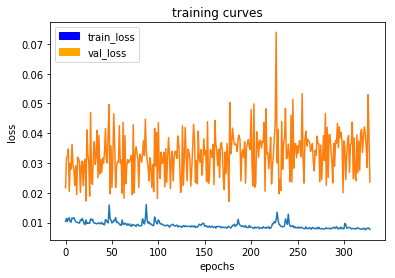

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0237
Epoch 330/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

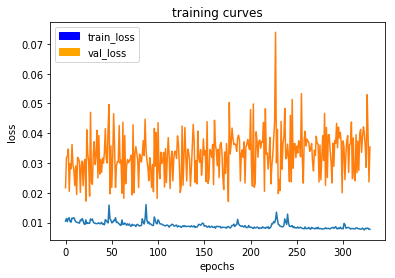

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0354
Epoch 331/400
49/50 [============================>.] - ETA: 1s - loss: 0.0084

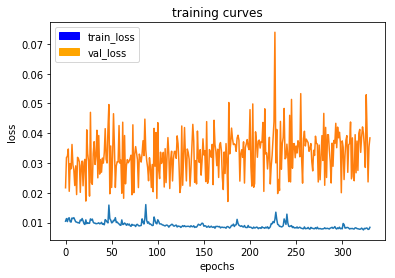

50/50 [==============================] - 76s - loss: 0.0084 - val_loss: 0.0384
Epoch 332/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

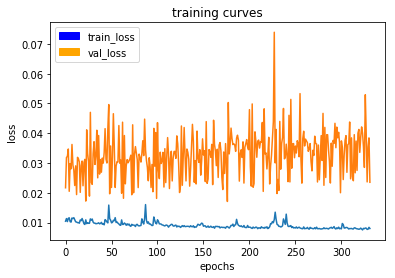

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0235
Epoch 333/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

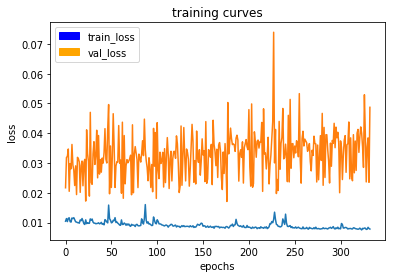

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0487
Epoch 334/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

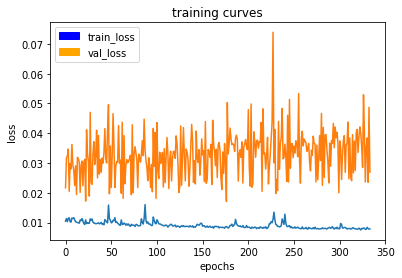

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0269
Epoch 335/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

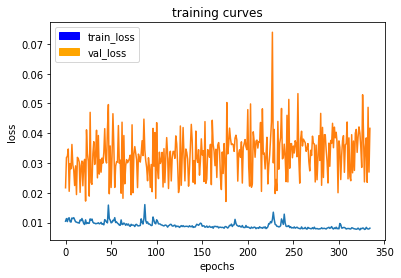

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0416
Epoch 336/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

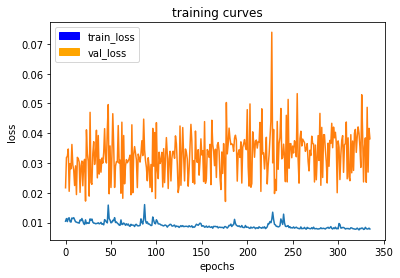

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0382
Epoch 337/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

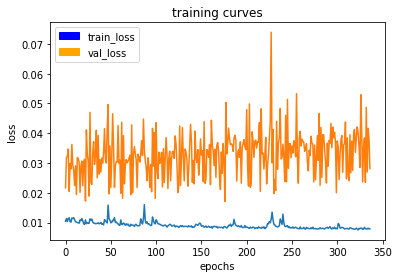

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0281
Epoch 338/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

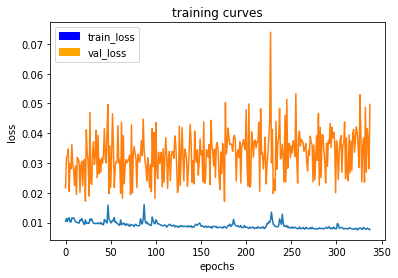

50/50 [==============================] - 77s - loss: 0.0076 - val_loss: 0.0497
Epoch 339/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

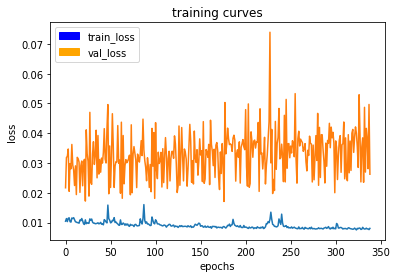

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0262
Epoch 340/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

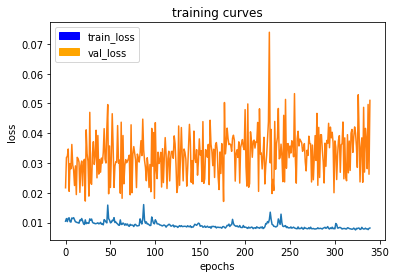

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0510
Epoch 341/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

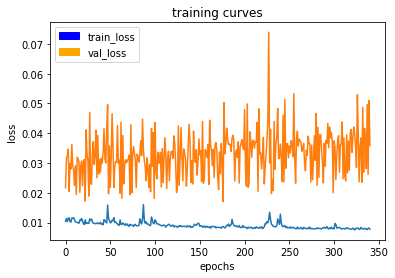

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0359
Epoch 342/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

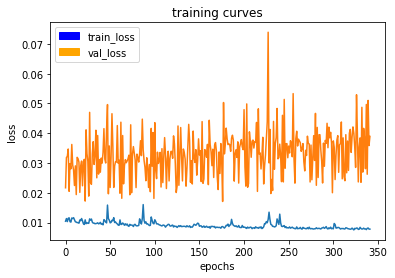

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0389
Epoch 343/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

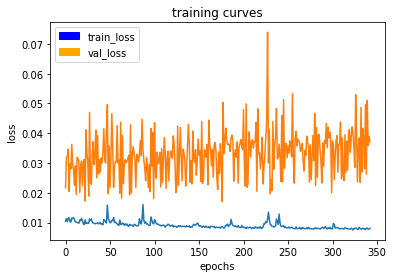

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0371
Epoch 344/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

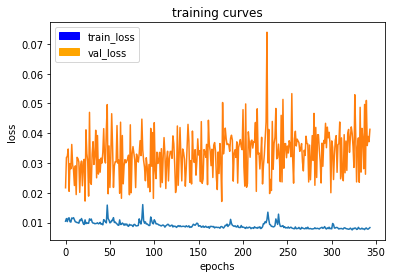

50/50 [==============================] - 76s - loss: 0.0083 - val_loss: 0.0413
Epoch 345/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

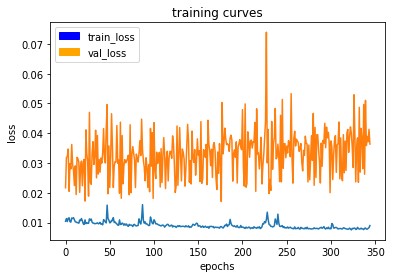

50/50 [==============================] - 77s - loss: 0.0090 - val_loss: 0.0364
Epoch 346/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

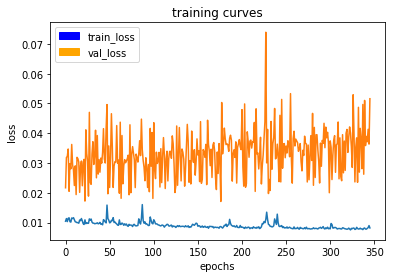

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0516
Epoch 347/400
49/50 [============================>.] - ETA: 1s - loss: 0.0118

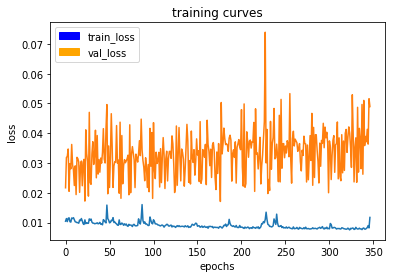

50/50 [==============================] - 76s - loss: 0.0117 - val_loss: 0.0490
Epoch 348/400
49/50 [============================>.] - ETA: 1s - loss: 0.0108

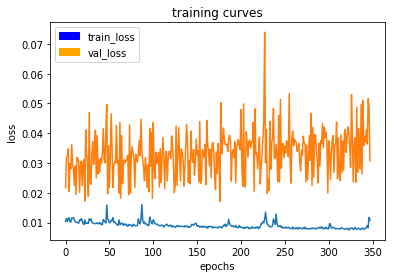

50/50 [==============================] - 76s - loss: 0.0108 - val_loss: 0.0307
Epoch 349/400
49/50 [============================>.] - ETA: 1s - loss: 0.0110

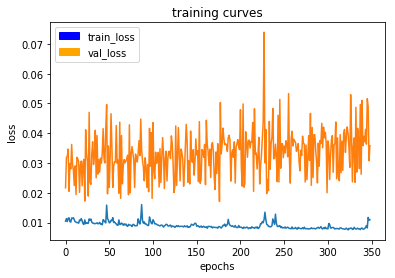

50/50 [==============================] - 77s - loss: 0.0109 - val_loss: 0.0358
Epoch 350/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

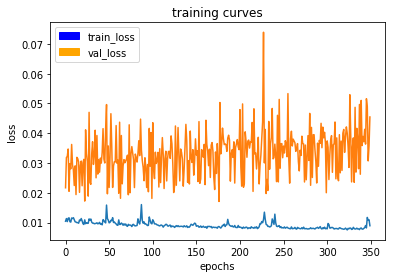

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0455
Epoch 351/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

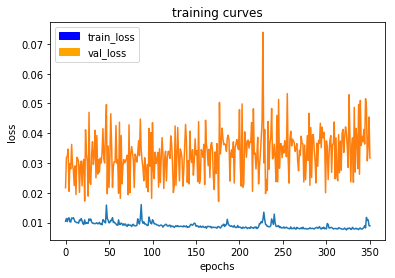

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0317
Epoch 352/400
49/50 [============================>.] - ETA: 1s - loss: 0.0088

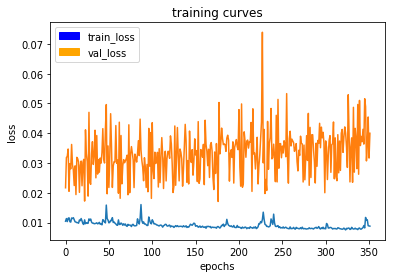

50/50 [==============================] - 76s - loss: 0.0088 - val_loss: 0.0400
Epoch 353/400
49/50 [============================>.] - ETA: 1s - loss: 0.0090

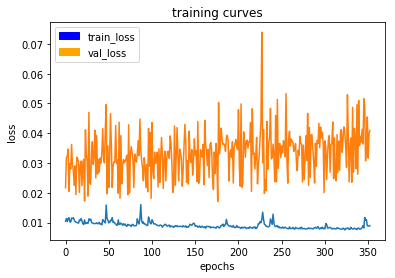

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0409
Epoch 354/400
49/50 [============================>.] - ETA: 1s - loss: 0.0095

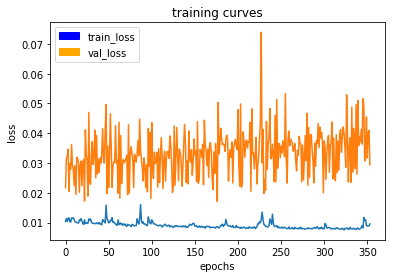

50/50 [==============================] - 77s - loss: 0.0095 - val_loss: 0.0294
Epoch 355/400
49/50 [============================>.] - ETA: 1s - loss: 0.0092

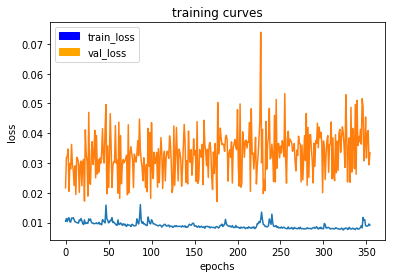

50/50 [==============================] - 77s - loss: 0.0092 - val_loss: 0.0335
Epoch 356/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

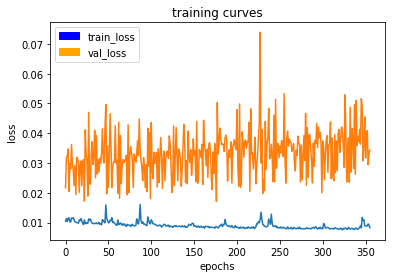

50/50 [==============================] - 76s - loss: 0.0082 - val_loss: 0.0343
Epoch 357/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

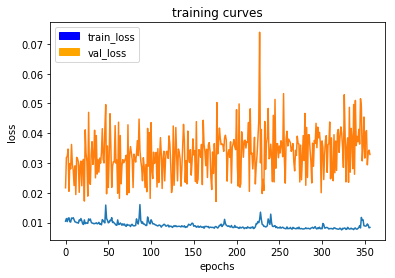

50/50 [==============================] - 77s - loss: 0.0084 - val_loss: 0.0329
Epoch 358/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

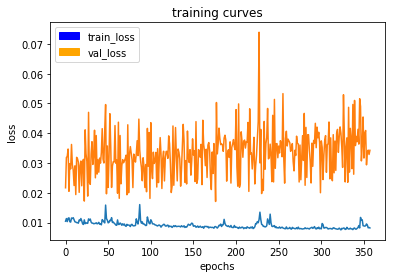

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0343
Epoch 359/400
49/50 [============================>.] - ETA: 1s - loss: 0.0089

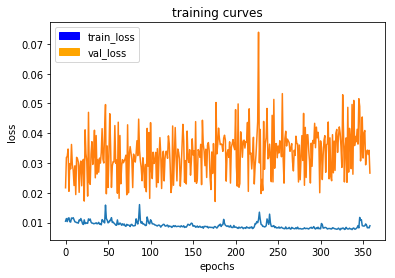

50/50 [==============================] - 77s - loss: 0.0089 - val_loss: 0.0266
Epoch 360/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

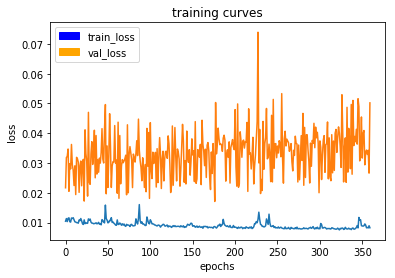

50/50 [==============================] - 77s - loss: 0.0082 - val_loss: 0.0502
Epoch 361/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

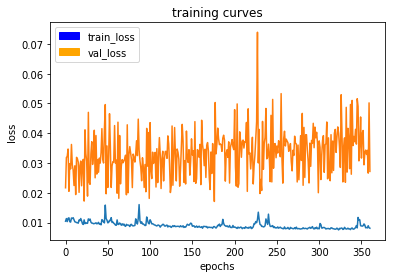

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0272
Epoch 362/400
49/50 [============================>.] - ETA: 1s - loss: 0.0081

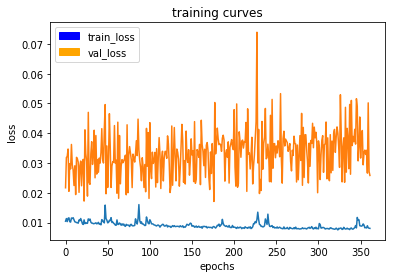

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0258
Epoch 363/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

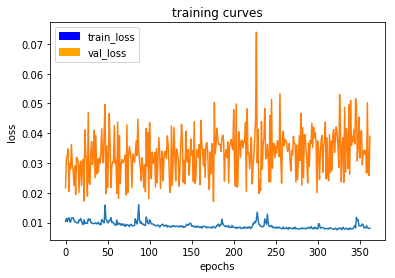

50/50 [==============================] - 77s - loss: 0.0081 - val_loss: 0.0389
Epoch 364/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

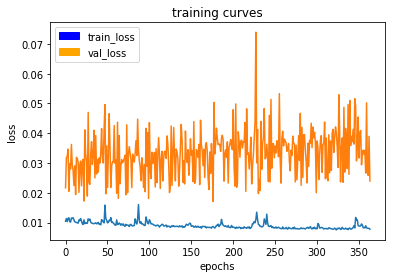

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0240
Epoch 365/400
49/50 [============================>.] - ETA: 1s - loss: 0.0082

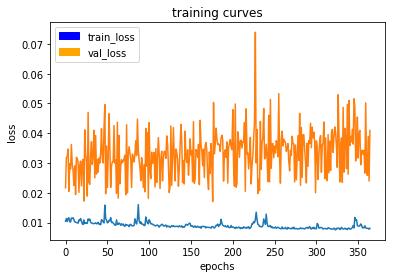

50/50 [==============================] - 76s - loss: 0.0081 - val_loss: 0.0409
Epoch 366/400
49/50 [============================>.] - ETA: 1s - loss: 0.0083

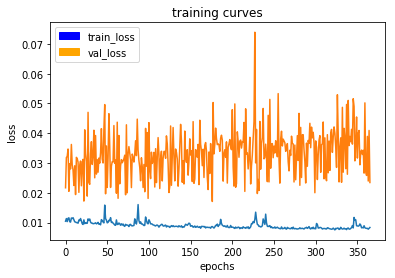

50/50 [==============================] - 77s - loss: 0.0083 - val_loss: 0.0235
Epoch 367/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

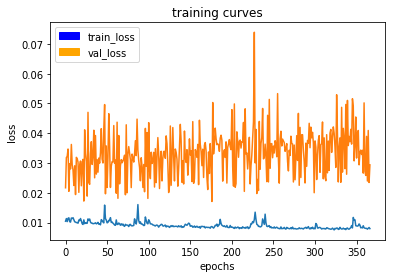

50/50 [==============================] - 76s - loss: 0.0080 - val_loss: 0.0294
Epoch 368/400
49/50 [============================>.] - ETA: 1s - loss: 0.0075

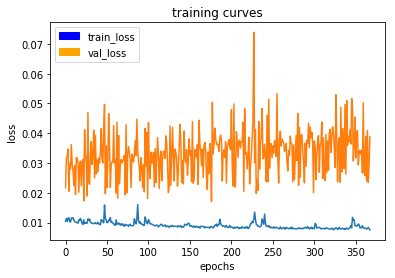

50/50 [==============================] - 77s - loss: 0.0075 - val_loss: 0.0388
Epoch 369/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

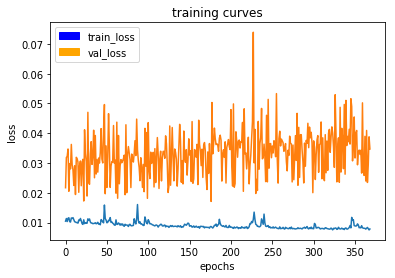

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0347
Epoch 370/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

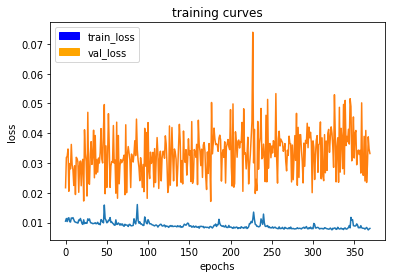

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0332
Epoch 371/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

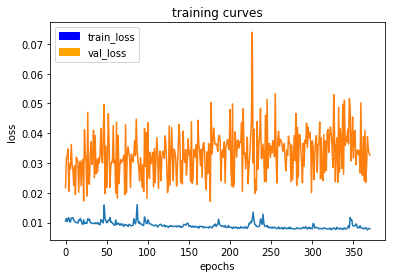

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0326
Epoch 372/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

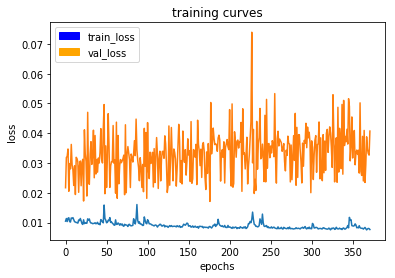

50/50 [==============================] - 77s - loss: 0.0076 - val_loss: 0.0407
Epoch 373/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

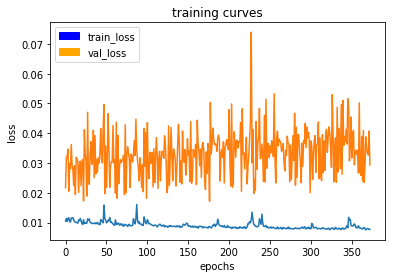

50/50 [==============================] - 76s - loss: 0.0077 - val_loss: 0.0294
Epoch 374/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

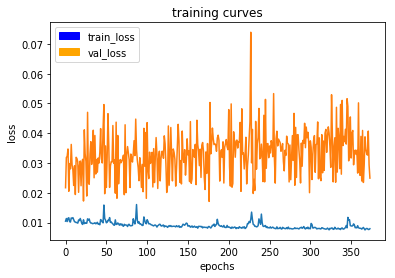

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0249
Epoch 375/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

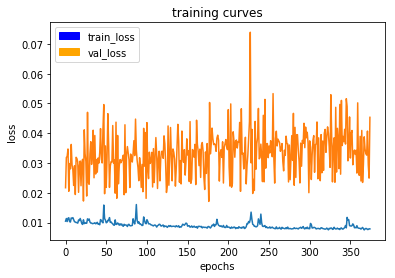

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0453
Epoch 376/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

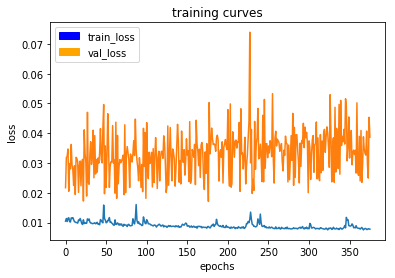

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0387
Epoch 377/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

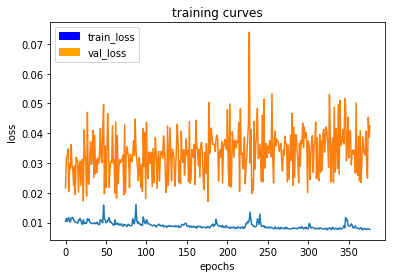

50/50 [==============================] - 76s - loss: 0.0077 - val_loss: 0.0424
Epoch 378/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

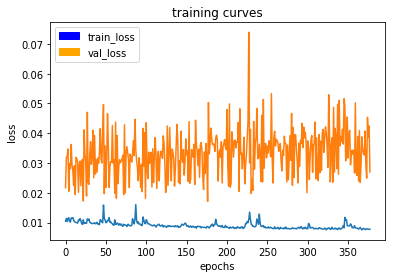

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0270
Epoch 379/400
49/50 [============================>.] - ETA: 1s - loss: 0.0080

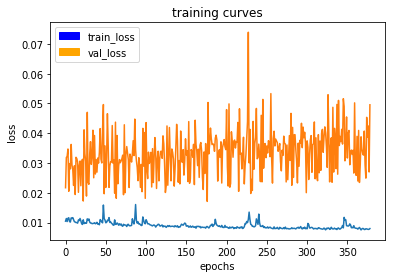

50/50 [==============================] - 77s - loss: 0.0080 - val_loss: 0.0496
Epoch 380/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

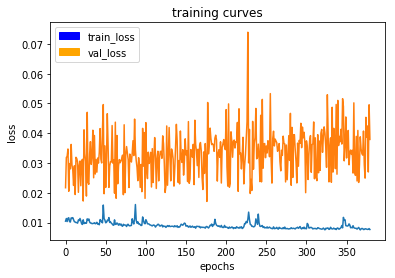

50/50 [==============================] - 77s - loss: 0.0076 - val_loss: 0.0379
Epoch 381/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

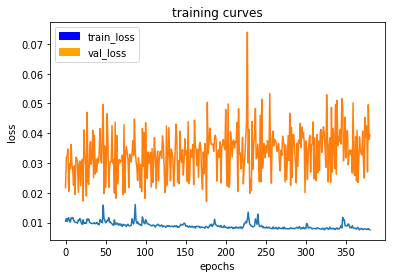

50/50 [==============================] - 76s - loss: 0.0076 - val_loss: 0.0394
Epoch 382/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

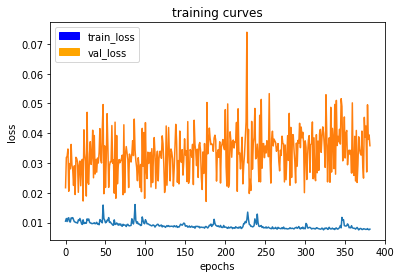

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0358
Epoch 383/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

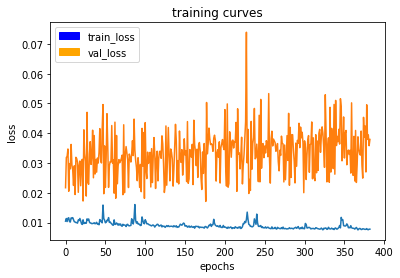

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0379
Epoch 384/400
49/50 [============================>.] - ETA: 1s - loss: 0.0075

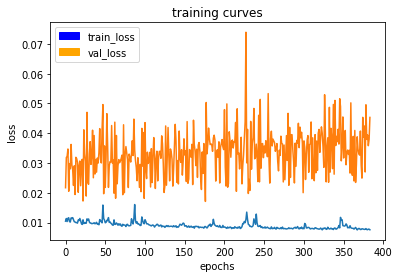

50/50 [==============================] - 77s - loss: 0.0076 - val_loss: 0.0453
Epoch 385/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

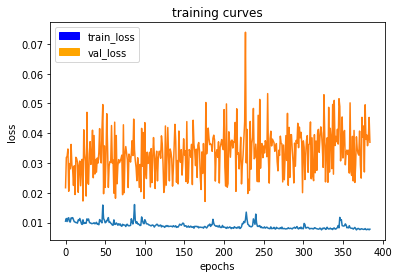

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0370
Epoch 386/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

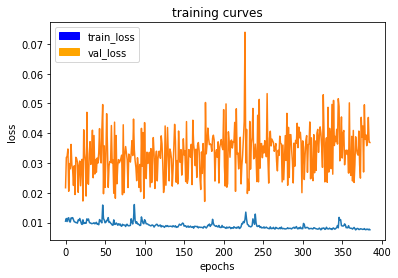

50/50 [==============================] - 76s - loss: 0.0076 - val_loss: 0.0369
Epoch 387/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

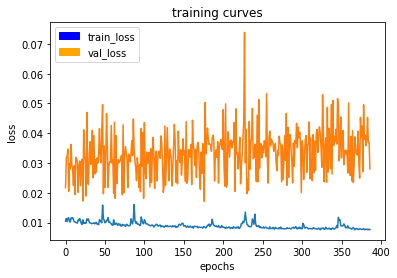

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0280
Epoch 388/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

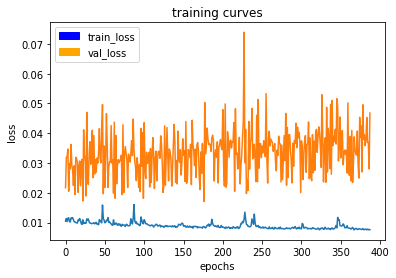

50/50 [==============================] - 76s - loss: 0.0076 - val_loss: 0.0468
Epoch 389/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

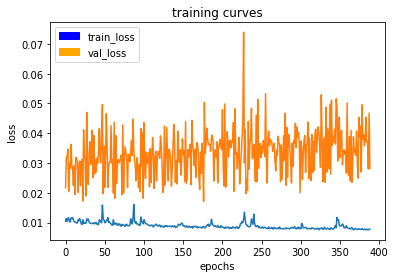

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0282
Epoch 390/400
49/50 [============================>.] - ETA: 1s - loss: 0.0076

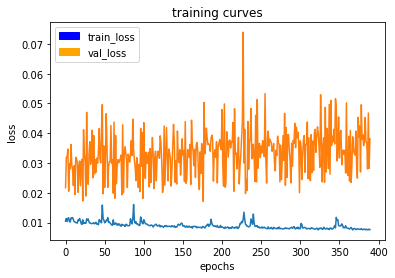

50/50 [==============================] - 76s - loss: 0.0076 - val_loss: 0.0381
Epoch 391/400
49/50 [============================>.] - ETA: 1s - loss: 0.0075

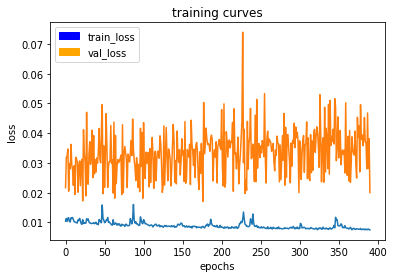

50/50 [==============================] - 77s - loss: 0.0075 - val_loss: 0.0200
Epoch 392/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

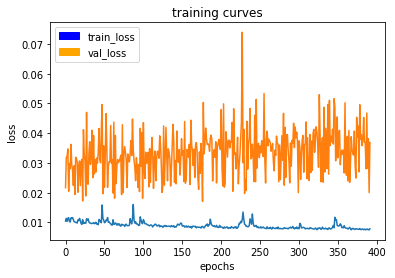

50/50 [==============================] - 76s - loss: 0.0079 - val_loss: 0.0369
Epoch 393/400
49/50 [============================>.] - ETA: 1s - loss: 0.0079

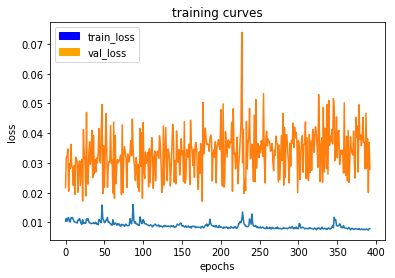

50/50 [==============================] - 77s - loss: 0.0079 - val_loss: 0.0279
Epoch 394/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

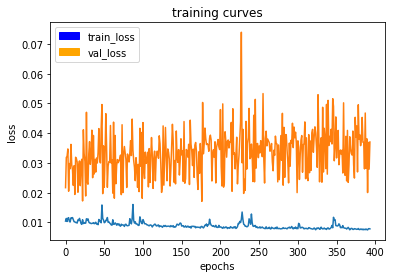

50/50 [==============================] - 76s - loss: 0.0078 - val_loss: 0.0370
Epoch 395/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

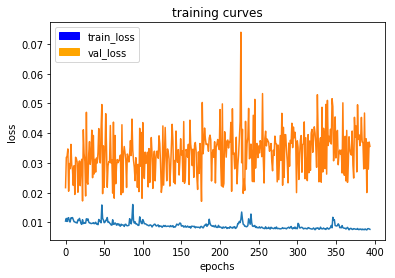

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0356
Epoch 396/400
49/50 [============================>.] - ETA: 1s - loss: 0.0078

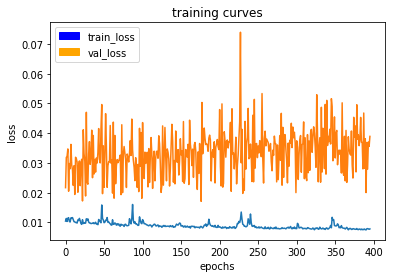

50/50 [==============================] - 77s - loss: 0.0078 - val_loss: 0.0389
Epoch 397/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

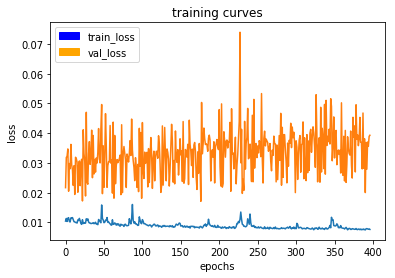

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0393
Epoch 398/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

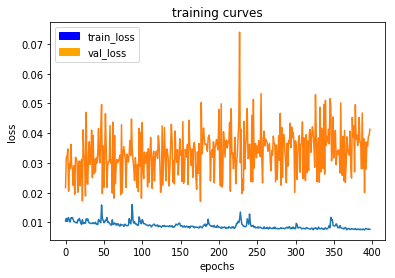

50/50 [==============================] - 76s - loss: 0.0077 - val_loss: 0.0413
Epoch 399/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

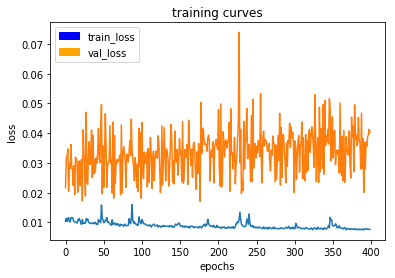

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0403
Epoch 400/400
49/50 [============================>.] - ETA: 1s - loss: 0.0077

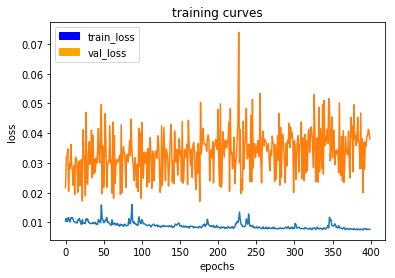

50/50 [==============================] - 77s - loss: 0.0077 - val_loss: 0.0380


In [30]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [31]:
# Save your trained model weights
weight_file_name = 'model_weights'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [32]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [33]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

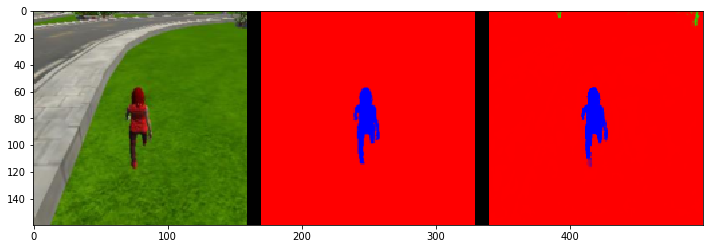

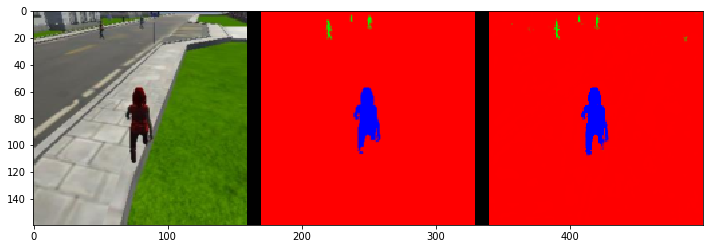

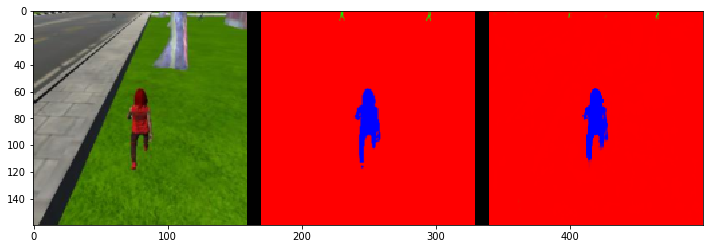

In [34]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

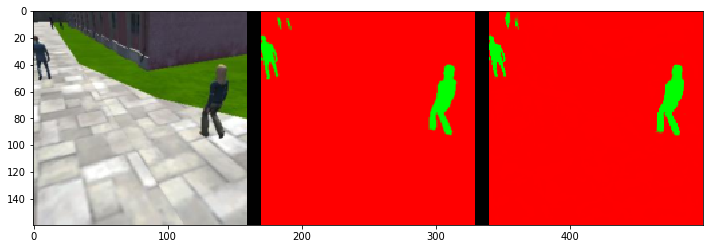

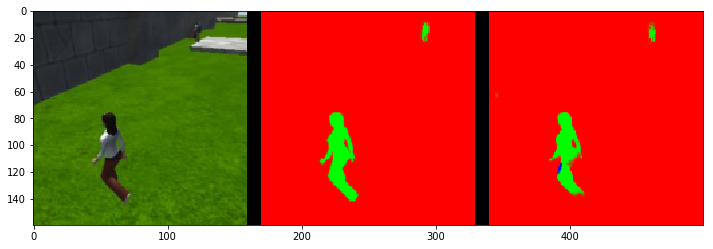

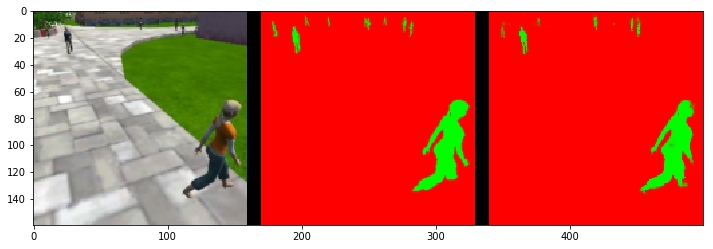

In [35]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

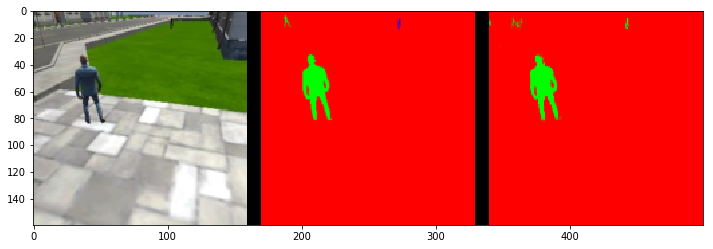

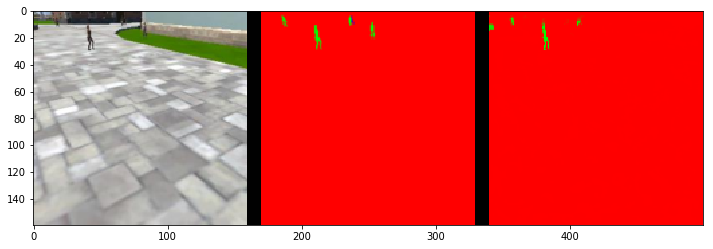

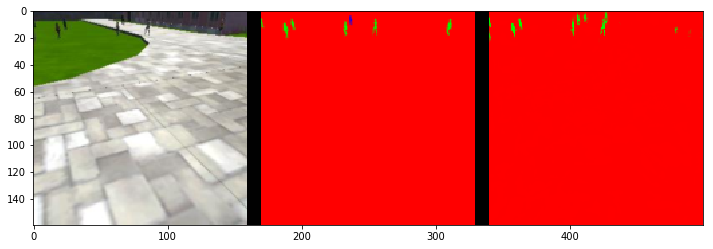

In [36]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [37]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9962712697468077
average intersection over union for other people is 0.388390665089457
average intersection over union for the hero is 0.9188413849312442
number true positives: 539, number false positives: 0, number false negatives: 0


In [38]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9886031463166721
average intersection over union for other people is 0.763390598357075
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 72, number false negatives: 0


In [39]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9968610316026172
average intersection over union for other people is 0.45965277771798235
average intersection over union for the hero is 0.18850499860546197
number true positives: 108, number false positives: 2, number false negatives: 193


In [40]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7078774617067833


In [41]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.553673191768


In [42]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.391932773604
